In [2]:
#Analysis of the renewables and solar consturction sector in Ireland 
#An existing dataset of the relatively new and expanding indusrty does exist (except for the SEAI database), so a seperate webscraping tak was undertaken to develop this dataset. 
#Initally, beutiful soup and python was used for the webscraping, however, various captacha challenges deemed this approach unacceptable. The extract was done using Octoparse and an image of the work flow can be found in the report for infomration.
#Three data sets were created - Two extracts from VisionnetID.ie (Irish companies involved in renewables) and Global database companies search in IE)

import pandas as pd
Vision_new_df = pd.read_excel('full Company Info - Vision-Net.xlsx')
GDB_df = pd.read_excel('Solar IE.GlobalDatabase.com.xlsx')
Vision_Solar_df = pd.read_excel('vision net ID solar companies.xlsx')

In [3]:
 Vision_new_df.head(50)

,CompanyName,CompanyStatus,CompanyAddress,CompanySize,CompanySize1,CompanySize_URL,Established,CompanyType
0,Solar Sounds Limited,DISSOLVED,"2 Carlton Terrace,\nNavaro Road,\nBray Co. Wic...",Log-In To View,Log-In,https://www.vision-net.ie/loginNoFrame.jsp,14/05/1969 (21 years in business).,Private
1,Solar Investments Limited,DISSOLVED,"Bective House,\nDawson Street,\nDublin 2.,\nDu...",Log-In To View,Log-In,https://www.vision-net.ie/loginNoFrame.jsp,26/06/1973 (17 years in business).,Private
2,Solar Thermal Glazing Co. Limited,DISSOLVED,"65 Collins Avenue,\nDonnycarney,\nDublin 9.,\n...",Log-In To View,Log-In,https://www.vision-net.ie/loginNoFrame.jsp,22/04/1974 (15 years in business).,Private
3,Irish Solar Energy Limited,DISSOLVED,"6 Lower Hatch Street,\nDublin 2.,\nDublin 2,Du...",Log-In To View,Log-In,https://www.vision-net.ie/loginNoFrame.jsp,29/11/1974 (15 years in business).,Private
4,Solarship (Ireland) Limited,DISSOLVED,"Alexander Basin,\nNorth Wall,\nDublin 1.,\nDublin",Log-In To View,Log-In,https://www.vision-net.ie/loginNoFrame.jsp,04/05/1977 (12 years in business).,Private
5,Solar Energy Systems Limited,DISSOLVED,"19 Charlestown Road,\nRanelagh,\nDublin 7.,\nD...",Log-In To View,Log-In,https://www.vision-net.ie/loginNoFrame.jsp,16/11/1977 (12 years in business).,Private
6,Solar Control Films Limited,DISSOLVED,"Solar House,\nSt. Martins Road,\nRosslare Harb...",Log-In To View,Log-In,https://www.vision-net.ie/loginNoFrame.jsp,22/05/1978 (10 years in business).,Private
7,Wind and Solar Technology Limited,DISSOLVED,"70 Clifton Grange,\nCork.,\nDouglas,Cork",Log-In To View,Log-In,https://www.vision-net.ie/loginNoFrame.jsp,26/01/1979 (10 years in business).,Private
8,Solarex (Ireland) Limited,DISSOLVED,"Coast Road,\nCo. Dublin.,\nPortmarnock,Dublin",Mr Nagle,NaN,NaN,Log-In To View,Private
9,Renew Tyres Limited,NORMAL,"Kilcoole Industrial Estate,\nCo. Wicklow.,\nKi...",+353 (0)1 287 3366,NaN,NaN,www.renew.ie,NaN


In [4]:
 Vision_new_df.tail()

,CompanyName,CompanyStatus,CompanyAddress,CompanySize,CompanySize1,CompanySize_URL,Established,CompanyType
807,NaN,NaN,NaN,Log-In To View,Log-In,https://www.vision-net.ie/loginNoFrame.jsp,NaN,NaN
808,Solar Turbines Europe S.A.,NORMAL,"C/O Mespil Business Centre,\nMespil House,\nSu...",Log-In To View,Log-In,https://www.vision-net.ie/loginNoFrame.jsp,NaN,NaN
809,Evolution Partners (Ireland) Limited,CEASED IRL,"Clifton House,\nFitzwilliam Street Lower,\nDub...",Log-In To View,Log-In,https://www.vision-net.ie/loginNoFrame.jsp,NaN,NaN
810,Sma Solar Technology Ag,NORMAL,"6th Floor,\nRiverpoint,\nLower Mallow Street,\...",Log-In To View,Log-In,https://www.vision-net.ie/loginNoFrame.jsp,NaN,External Company
811,Jbm Solar Limited,NORMAL,"54 Main Street,\nDundrum,\n,Ireland",Mr Pillai,NaN,NaN,Log-In To View,External Company


In [5]:
 Vision_new_df.describe() 

,CompanyName,CompanyStatus,CompanyAddress,CompanySize,CompanySize1,CompanySize_URL,Established,CompanyType
count,810,810,810,811,101,101,770,330
unique,810,7,574,409,9,9,104,13
top,Solar Sounds Limited,NORMAL,"11 Anglesea Street,\nCo. Cork, Cork",Log-In To View,Log-In,https://www.vision-net.ie/loginNoFrame.jsp,Log-In To View,LTD - Private Company Limited By Shares
freq,1,527,32,93,93,93,655,192


In [6]:
 Vision_new_df.info()       # data type and missing value information


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 812 entries, 0 to 811
Data columns (total 8 columns):
 #   Column           Non-Null Count  Dtype 
---  ------           --------------  ----- 
 0   CompanyName      810 non-null    object
 1   CompanyStatus    810 non-null    object
 2   CompanyAddress   810 non-null    object
 3   CompanySize      811 non-null    object
 4   CompanySize1     101 non-null    object
 5   CompanySize_URL  101 non-null    object
 6   Established      770 non-null    object
 7   CompanyType      330 non-null    object
dtypes: object(8)
memory usage: 50.9+ KB


In [7]:
#dropping three colums as the data is not relevant and requires logging into visionnetID to extract.
Vision_new_df =  Vision_new_df.drop(['CompanySize', 'CompanySize1', 'CompanySize_URL'], axis=1)

In [8]:
 Vision_new_df.shape

(812, 5)

In [9]:
# data cleaning steps - recoding variables, correcting data types and removing redundant symobols
#Remove the symbol infront of the price and replace name: 

Vision_new_df.rename(columns={'CompanyName':'Name'}, inplace=True)
Vision_new_df.rename(columns={'CompanyStatus':'Status'}, inplace=True)
Vision_new_df.rename(columns={'CompanyAddress':'Full_Add'}, inplace=True)
Vision_new_df.rename(columns={'Not Full Market Price':'price_nm'}, inplace=True)
Vision_new_df.rename(columns={'CompanyType':'Type'}, inplace=True)


In [10]:
 Vision_new_df.info()  

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 812 entries, 0 to 811
Data columns (total 5 columns):
 #   Column       Non-Null Count  Dtype 
---  ------       --------------  ----- 
 0   Name         810 non-null    object
 1   Status       810 non-null    object
 2   Full_Add     810 non-null    object
 3   Established  770 non-null    object
 4   Type         330 non-null    object
dtypes: object(5)
memory usage: 31.8+ KB


In [11]:
import re
from geopy.geocoders import Nominatim
import time

# set a custom user agent for Nominatim
geolocator = Nominatim(user_agent="Solar_IE_project2023")

# define a function to clean and standardize the addresses
    
def clean_address(address):
    # check if the address is a string
    if not isinstance(address, str):
        return None
    # remove any commas at the end of the address
    address = re.sub(r',\s*$', '', address)
    # convert the address to title case
    address = address.lower()
    # replace abbreviations with their full words
    address = address.replace("st.", "street")
    # remove extra whitespace and commas between words
    address = re.sub(r'\s*,\s*',' ', address).strip()
    # add "Ireland" to the end of the address
    address += " Ireland"
    return address

# create empty lists to store latitude and longitude values
latitudes = []
longitudes = []

# iterate over each address in the 'Full_Add' column
for address in Vision_new_df['Full_Add']:
    # clean and standardize the address
    address = clean_address(address)
    print("Geocoding address:", address)
    try:
        location = geolocator.geocode(address)
        latitude = location.latitude
        longitude = location.longitude
        latitudes.append(latitude)
        longitudes.append(longitude)
        print("Location found: latitude = {}, longitude = {}".format(latitude, longitude))
    except:
        latitude = None
        longitude = None
        latitudes.append(latitude)
        longitudes.append(longitude)
        print("Location not found")
    # add a delay of 1 second between geocoding requests
    time.sleep(1)
  
# add the 'latitudes' and 'longitudes' lists as new columns to the dataframe
Vision_new_df['latitude'] = pd.Series(latitudes, index=Vision_new_df.index)
Vision_new_df['longitude'] = pd.Series(longitudes, index=Vision_new_df.index)

# create a Pandas dataframe from the 'Vision_new_df' dataframe
df = pd.DataFrame(Vision_new_df)

# write the dataframe to an xls file as the geocoding takes a long time and is more accessible this way.
Vision_new_df.to_excel('Vision_new_map.xlsx', index=False)


Geocoding address: 2 carlton terrace navaro road bray co. wicklow. bray wicklow Ireland
Location not found
Geocoding address: bective house dawson street dublin 2. dublin 2 dublin Ireland
Location not found
Geocoding address: 65 collins avenue donnycarney dublin 9. dublin Ireland
Location found: latitude = 53.376074620073126, longitude = -6.220771626839863
Geocoding address: 6 lower hatch street dublin 2. dublin 2 dublin Ireland
Location found: latitude = 53.3341505, longitude = -6.2562891
Geocoding address: alexander basin north wall dublin 1. dublin Ireland
Location not found
Geocoding address: 19 charlestown road ranelagh dublin 7. dublin Ireland
Location not found
Geocoding address: solar house street martins road rosslare harbour co. wexford. wexford Ireland
Location not found
Geocoding address: 70 clifton grange cork. douglas cork Ireland
Location not found
Geocoding address: coast road co. dublin. portmarnock dublin Ireland
Location found: latitude = 53.4093811, longitude = -6.1

Geocoding address: 14 street stephen's green dublin 2. dublin Ireland
Location not found
Geocoding address: 3 burlington road dublin 4 dublin Ireland
Location found: latitude = 53.33189075, longitude = -6.246544589626014
Geocoding address: pitch perfect mount music tarelton macroom co cork co. cork cork Ireland
Location not found
Geocoding address: 90 nprth circular road dublin 7 dublin Ireland
Location not found
Geocoding address: 1a rohoboth works south circular road dublin 8 dublin Ireland
Location not found
Geocoding address: limerick road nenagh tipperary Ireland
Location found: latitude = 52.8548201, longitude = -8.2359699
Geocoding address: clooncara ballaghaderreen boyle roscommon Ireland
Location not found
Geocoding address: 21 main street blackrock co. dublin Ireland
Location found: latitude = 53.30133065, longitude = -6.17755755
Geocoding address: 20 churchfield close co. dublin dublin ireland Ireland
Location not found
Geocoding address: 17 kildare street dublin 2 dublin ir

Geocoding address: 3 beechlawn industrial complex walkinstown dublin 12 co. dublin dublin Ireland
Location not found
Geocoding address: drumbrone magheracloone carrickmacross co. monaghan carrickmacross monaghan Ireland
Location not found
Geocoding address: 7 pairc na deireachta kilnagurteen macroom co. cork macroom. co. cork. cork Ireland
Location not found
Geocoding address: 10 delacy crescent trim meath Ireland
Location not found
Geocoding address: 76 park boulevard tyrellstown dublin 15 dublin Ireland
Location found: latitude = 53.4200004, longitude = -6.3861511
Geocoding address: 45 ballea woods ballea road carrigaline co. cork carrigaline cork Ireland
Location not found
Geocoding address: avalon usk dunlavin dunlavin wicklow Ireland
Location not found
Geocoding address: 13 castleriada lucan dublin Ireland
Location not found
Geocoding address: 27 mulgrave street dun laoghaire dublin Ireland
Location found: latitude = 53.2902594, longitude = -6.137266025187166
Geocoding address: un

Location not found
Geocoding address: coliemore house coliemore road dalkey co. dublin dublin Ireland
Location found: latitude = 53.2772541, longitude = -6.1029684
Geocoding address: 2nd floor city gate building 1000 mahon cork co. cork cork Ireland
Location not found
Geocoding address: 97 hartwell green kill co. kildare. kildare Ireland
Location not found
Geocoding address: unit 1b 3 custom house plaza harbour master place dublin 1 dublin Ireland
Location not found
Geocoding address: unit k23 drinan enterprise centre swords enterprise park feltrim road swords co. dublin. swords dublin Ireland
Location not found
Geocoding address: unit 7 sandyford business centre burton hall road sandyford dublin 18 sandyford dublin Ireland
Location not found
Geocoding address: rathcoole premier office centre main street rathcoole dublin 24 rathcoole dublin Ireland
Location not found
Geocoding address: ramsgrange wexford Ireland
Location found: latitude = 52.2451176, longitude = -6.9196647
Geocoding ad

Geocoding address: 11 anglesea street co. cork cork Ireland
Location found: latitude = 51.8951566, longitude = -8.4655871
Geocoding address: 11 anglesea street co. cork cork Ireland
Location found: latitude = 51.8951566, longitude = -8.4655871
Geocoding address: cronelea upper shillelagh arklow co. wicklow arklow wicklow Ireland
Location not found
Geocoding address: 11 anglesea street co. cork cork Ireland
Location found: latitude = 51.8951566, longitude = -8.4655871
Geocoding address: 11 anglesea street co. cork cork Ireland
Location found: latitude = 51.8951566, longitude = -8.4655871
Geocoding address: 11 anglesea street co. cork cork Ireland
Location found: latitude = 51.8951566, longitude = -8.4655871
Geocoding address: 11 anglesea street co. cork cork Ireland
Location found: latitude = 51.8951566, longitude = -8.4655871
Geocoding address: unit 5a fingal bay business park balbriggan co dublin balbriggan dublin Ireland
Location not found
Geocoding address: ballinurra carrick on sui

Location not found
Geocoding address: ballysimon house ballysimon co. limerick. ireland co. limerick limerick Ireland
Location not found
Geocoding address: moynalty kells meath Ireland
Location found: latitude = 53.7890118, longitude = -6.886633
Geocoding address: 5 mount street upper dublin 2 dublin ireland Ireland
Location not found
Geocoding address: 5 mount street upper dublin 2 dublin ireland Ireland
Location not found
Geocoding address: the liberty centre blanchardstown retail park dublin 15 dublin 15 dublin Ireland
Location not found
Geocoding address: ballyseskin house ballyseskin kilmore co. wexford kilmore wexford Ireland
Location found: latitude = 52.2054734, longitude = -6.534613050000001
Geocoding address: ballysimon house ballysimon co. limerick. ireland co. limerick limerick Ireland
Location not found
Geocoding address: 25 vernon heath dublin 3 clontarf dublin Ireland
Location found: latitude = 53.3680988, longitude = -6.1932235
Geocoding address: 1 the seapoint building

Geocoding address: 92 south mall co. cork cork Ireland
Location found: latitude = 51.8975922, longitude = -8.4679099
Geocoding address: ballyseskin house ballyseskin kilmore co. wexford kilmore wexford Ireland
Location found: latitude = 52.2054734, longitude = -6.534613050000001
Geocoding address: 3rd floor ulysses house foley street dublin 1 dublin 1 dublin Ireland
Location not found
Geocoding address: finance house main street charleville cork ireland Ireland
Location not found
Geocoding address: finance house main street charleville cork ireland Ireland
Location not found
Geocoding address: 2 merrion place dublin 2 dublin Ireland
Location found: latitude = 53.3391342, longitude = -6.2519356
Geocoding address: carrigeen bus park clonmel tipperary Ireland
Location found: latitude = 52.3644041, longitude = -7.6917544576100845
Geocoding address: the black church street mary's place dublin co. dublin dublin Ireland
Location not found
Geocoding address: cherrywood chapel lane newbridge co

Location not found
Geocoding address: 5 mount street upper dublin 2 dublin ireland Ireland
Location not found
Geocoding address: inniscarra main street rathcoole co. dublin rathcoole dublin Ireland
Location not found
Geocoding address: hambleden house 19-26 pembroke street lower dublin 2 dublin Ireland
Location not found
Geocoding address: 27 fitzwilliam street lower dublin 2 Ireland
Location found: latitude = 53.33708795, longitude = -6.248116929765414
Geocoding address: hambleden house 19-26 pembroke street lower dublin 2 dublin Ireland
Location not found
Geocoding address: hambleden house 19-26 pembroke street lower dublin 2 dublin Ireland
Location not found
Geocoding address: hambleden house 19-26 pembroke street lower dublin 2 dublin Ireland
Location not found
Geocoding address: hambleden house 19-26 pembroke street lower dublin 2 dublin Ireland
Location not found
Geocoding address: hambleden house 19-26 pembroke street lower dublin 2 dublin Ireland
Location not found
Geocoding ad

Geocoding address: 35 neilstown park clondalkin dublin 22 dublin ireland Ireland
Location not found
Geocoding address: 11 anglesea street co. cork cork Ireland
Location found: latitude = 51.8951566, longitude = -8.4655871
Geocoding address: ceased trading notification Ireland
Location not found
Geocoding address: building 4200 cork airport business park co. cork cork ireland Ireland
Location not found
Geocoding address: building 4200 cork airport business park co. cork cork ireland Ireland
Location not found
Geocoding address: building 4200 cork airport business park co. cork cork ireland Ireland
Location not found
Geocoding address: ballyhaunis road co. mayo claremorris mayo Ireland
Location found: latitude = 53.9635283, longitude = -8.7941807
Geocoding address: building 4200 cork airport business park co. cork cork ireland Ireland
Location not found
Geocoding address: building 4200 cork airport business park co. cork cork ireland Ireland
Location not found
Geocoding address: ballyses

Geocoding address: community centre kilanerin gorey wexford ireland Ireland
Location not found
Geocoding address: inniscarra main street rathcoole dublin ireland Ireland
Location not found
Geocoding address: ceased trading notification Ireland
Location not found
Geocoding address: 93 inis mór father russell road limerick limerick Ireland
Location not found
Geocoding address: fourth floor 1 south mall cork ireland Ireland
Location not found
Geocoding address: 12 dunmurray view kildare town kildare ireland Ireland
Location not found
Geocoding address: community centre kilanerin gorey wexford ireland Ireland
Location not found
Geocoding address: 19 ormond road south rathmines dublin 6 dublin Ireland
Location not found
Geocoding address: bishopstown lismore waterford ireland Ireland
Location not found
Geocoding address: 24 maydenhayes crescent donacarney co. meath drogheda meath ireland Ireland
Location not found
Geocoding address: ballaugh east abbeyfeale limerick Ireland
Location not fou

Geocoding address: 19 ormond road south rathmines dublin 6 ireland Ireland
Location not found
Geocoding address: 35 gurteen park ballyfermot dublin ireland Ireland
Location not found
Geocoding address: ardscull athy kildare Ireland
Location found: latitude = 53.01678405, longitude = -6.912720663006418
Geocoding address: belview port belview waterford ireland Ireland
Location not found
Geocoding address: coliemore house coliemore road dalkey dublin ireland Ireland
Location not found
Geocoding address: 39 john street kilkenny kilkenny ireland Ireland
Location not found
Geocoding address: rear unit 7 church place glenageary dublin ireland Ireland
Location not found
Geocoding address: unit 1 village business centre upper new street kilkenny ireland Ireland
Location not found
Geocoding address: 4 kellyville park portlaoise laois ireland Ireland
Location not found
Geocoding address: college road nobber meath ireland Ireland
Location not found
Geocoding address: greaghcrotta tullyco cootehill

C:\Users\User\AppData\Local\Temp\ipykernel_11748\1604955403.py:59: FutureWarning: As the xlwt package is no longer maintained, the xlwt engine will be removed in a future version of pandas. This is the only engine in pandas that supports writing in the xls format. Install openpyxl and write to an xlsx file instead. You can set the option io.excel.xls.writer to 'xlwt' to silence this warning. While this option is deprecated and will also raise a warning, it can be globally set and the warning suppressed.
  Vision_new_df.to_excel('Vision_new_map.xls', index=False)


ModuleNotFoundError: No module named 'xlwt'

In [12]:
Vision_new_df.columns

Index(['Name', 'Status', 'Full_Add', 'Established', 'Type'], dtype='object')

In [13]:
Vision_new_df.shape

(812, 5)

In [67]:
#USEFINAL
import folium

# create a map centered on Ireland
map_center = [53.3498, -6.2603]
ireland_map = folium.Map(location=map_center, zoom_start=7)

# create feature groups for the markers
normal_fg = folium.FeatureGroup(name='NORMAL')
dissolved_fg = folium.FeatureGroup(name='DISSOLVED')
ceased_fg = folium.FeatureGroup(name='CEASED IRL')
dissolved_20_fg = folium.FeatureGroup(name='DISSOLVED-20 YEARS')
na_fg = folium.FeatureGroup(name='N/A')

# filter out rows with nan status
Vision_filtered_df = Vision_new_df.dropna(subset=['Status'])

# add markers for each data point
for index, row in Vision_new_df.iterrows():
    address = row['Full_Add']
    status = row['Status']
    latitude = row['latitude']
    longitude = row['longitude']
    Name = row['Name']

    # add a marker for the data point, color-coded based on status
    if status == 'NORMAL':
        marker = folium.Marker(location=[latitude, longitude], popup=Name, icon=folium.Icon(color='green'))
        marker.add_to(normal_fg)
    elif status == 'DISSOLVED':
        marker = folium.Marker(location=[latitude, longitude], popup=Name, icon=folium.Icon(color='red'))
        marker.add_to(dissolved_fg)
    elif status == 'CEASED IRL':
        marker = folium.Marker(location=[latitude, longitude], popup=Name, icon=folium.Icon(color='orange'))
        marker.add_to(ceased_fg)
    elif status == 'DISSOLVED-20 YEARS':
        marker = folium.Marker(location=[latitude, longitude], popup=Name, icon=folium.Icon(color='black'))
        marker.add_to(dissolved_20_fg)
    elif pd.isna(status):
        marker = folium.Marker(location=[latitude, longitude], popup=Name, icon=folium.Icon(color='gray'))
        marker.add_to(na_fg)

# add the feature groups to the map
normal_fg.add_to(ireland_map)
dissolved_fg.add_to(ireland_map)
ceased_fg.add_to(ireland_map)
dissolved_20_fg.add_to(ireland_map)
na_fg.add_to(ireland_map)

# add layer control to the map
folium.map.LayerControl(position='topright', collapsed=False).add_to(ireland_map)

# display the map
ireland_map



In [ ]:
# This is the start of the analysis of the second scraped database - Global database of registered companies in Ireland followig a search for Solar.

In [16]:
GDB_df.head()

,Title,Title_URL,badge,btnsubscribe,Company,Company1,Company2,Company3,Company4,Company5,Company6,Company7,Company8,Company9,Company10,Company11,Company12,Company13,Company14,Company15
0,MY SOLAR LIMITED,https://ie.globaldatabase.com/company/my-solar...,ACTIVE,Buy Credit Report,IE651647,Age of business,4 years,Nr of Employees,3,Revenue,---,Industry,-,Country,Email,Unavailable,City,DONACARNEY,Website,Phone
1,BLUE PINE SOLAR 21 LIMITED,https://ie.globaldatabase.com/company/blue-pin...,ACTIVE,Buy Credit Report,IE648340,Age of business,4 years,Nr of Employees,7,Revenue,---,Industry,35110 - Production of electricity,Country,Email,Unavailable,City,19-26 PEMBROKE STREET LOWER,Website,Phone
2,SOLAR MOTORWAYS LIMITED,https://ie.globaldatabase.com/company/solar-mo...,ACTIVE,Buy Credit Report,IE718852,Age of business,1 years,Nr of Employees,2,Revenue,---,Industry,-,Country,Email,Unavailable,City,QUARRY ROAD SHANKILL,Website,Phone
3,ENERGYSERV SOLAR LIMITED,https://ie.globaldatabase.com/company/energyse...,ACTIVE,Buy Credit Report,IE686910,Age of business,2 years,Nr of Employees,2,Revenue,---,Industry,-,Country,Email,Unavailable,City,New RossWEXFORDIreland,Website,Phone
4,KILRUE SOLAR PARK LIMITED,https://ie.globaldatabase.com/company/kilrue-s...,ACTIVE,Buy Credit Report,IE680243,Age of business,3 years,Nr of Employees,0,Revenue,---,Industry,-,Country,Email,Unavailable,City,MAIN STREET CHARLEVILLE,Website,Phone


In [17]:
 GDB_df.tail()

,Title,Title_URL,badge,btnsubscribe,Company,Company1,Company2,Company3,Company4,Company5,Company6,Company7,Company8,Company9,Company10,Company11,Company12,Company13,Company14,Company15
2491,BOYLAN RUSSELL & COMPANY LIMITED,https://ie.globaldatabase.com/company/boylan-r...,ACTIVE,Buy Credit Report,IE715603,Age of business,New,Nr of Employees,3,Revenue,---,Industry,-,Country,Email,Unavailable,City,DROGHEDALOUTHIreland,Website,Phone
2492,RACHEL GORRY LIMITED,https://ie.globaldatabase.com/company/rachel-g...,ACTIVE,Buy Credit Report,IE691919,Age of business,2 years,Nr of Employees,2,Revenue,---,Industry,-,Country,Email,Unavailable,City,COOLAGARY WALSH ISLAND,Website,Phone
2493,DSN FURNITURE LIMITED,https://ie.globaldatabase.com/company/dsn-furn...,ACTIVE,Buy Credit Report,IE662090,Age of business,3 years,Nr of Employees,1,Revenue,---,Industry,-,Country,Email,Unavailable,City,"GRANGEBELLEW DROGHEDA CO LOUTH, DROGHEDALOUTH",Website,Phone
2494,EIRFAB PRECISION LIMITED,https://ie.globaldatabase.com/company/eirfab-p...,ACTIVE,Buy Credit Report,IE651915,Age of business,3 years,Nr of Employees,4,Revenue,---,Industry,25920 - Manufacture of light metal packaging,Country,Email,Unavailable,City,BALLYMOUNT DRIVE,Website,Phone
2495,KSK RATHMOR ENGINEERING LIMITED,https://ie.globaldatabase.com/company/ksk-rath...,ACTIVE,Buy Credit Report,IE666345,Age of business,3 years,Nr of Employees,1,Revenue,---,Industry,-,Country,Email,Unavailable,City,ELAGHBEG BUSINESS PARK BURNFOOT,Website,Phone


In [18]:
GDB_df.describe() 

,Title,Title_URL,badge,btnsubscribe,Company,Company1,Company2,Company3,Company4,Company5,Company6,Company7,Company8,Company9,Company10,Company11,Company12,Company13,Company14,Company15
count,2496,2496,2327,2496,2496,2496,2496,2496,2496,2496,2496,2496,2496,2496,2496,2496,2496,2496,2496,2496
unique,2494,2494,1,1,2494,1,35,1,55,1,165,1,150,1,1,2,1,1568,1,1
top,ENERGYSERV SOLAR LIMITED,https://ie.globaldatabase.com/company/energyse...,ACTIVE,Buy Credit Report,IE686910,Age of business,2 years,Nr of Employees,2,Revenue,---,Industry,-,Country,Email,Unavailable,City,---,Website,Phone
freq,2,2,2327,2496,2,2496,699,2496,609,2496,2270,2496,1702,2496,2496,2495,2496,405,2496,2496


In [19]:
GDB_df.info()       # data type and missing value information


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2496 entries, 0 to 2495
Data columns (total 20 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Title         2496 non-null   object
 1   Title_URL     2496 non-null   object
 2   badge         2327 non-null   object
 3   btnsubscribe  2496 non-null   object
 4   Company       2496 non-null   object
 5   Company1      2496 non-null   object
 6   Company2      2496 non-null   object
 7   Company3      2496 non-null   object
 8   Company4      2496 non-null   object
 9   Company5      2496 non-null   object
 10  Company6      2496 non-null   object
 11  Company7      2496 non-null   object
 12  Company8      2496 non-null   object
 13  Company9      2496 non-null   object
 14  Company10     2496 non-null   object
 15  Company11     2496 non-null   object
 16  Company12     2496 non-null   object
 17  Company13     2496 non-null   object
 18  Company14     2496 non-null   object
 19  Compan

In [20]:
#dropping three colums as the data is not relevant and requires logging into visionnetID to extract.
GDB_df =  GDB_df.drop(['Company1', 'Company3', 'Company5','Company6','Company14','Company15'], axis=1)

In [21]:
GDB_df.shape

(2496, 14)

In [22]:
# data cleaning steps - recoding variables, correcting data types and removing redundant symobols
#Remove the symbol infront of the price and replace name: 

GDB_df.rename(columns={'Company2':'Bis_age'}, inplace=True)
GDB_df.rename(columns={'Company4':'No.Employees'}, inplace=True)
GDB_df.rename(columns={'Company13':'Add'}, inplace=True)
GDB_df.rename(columns={'Title':'Name'}, inplace=True)
GDB_df.rename(columns={'Company':'Vat.No'}, inplace=True)


In [23]:
GDB_df.info()  

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2496 entries, 0 to 2495
Data columns (total 14 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Name          2496 non-null   object
 1   Title_URL     2496 non-null   object
 2   badge         2327 non-null   object
 3   btnsubscribe  2496 non-null   object
 4   Vat.No        2496 non-null   object
 5   Bis_age       2496 non-null   object
 6   No.Employees  2496 non-null   object
 7   Company7      2496 non-null   object
 8   Company8      2496 non-null   object
 9   Company9      2496 non-null   object
 10  Company10     2496 non-null   object
 11  Company11     2496 non-null   object
 12  Company12     2496 non-null   object
 13  Add           2496 non-null   object
dtypes: object(14)
memory usage: 273.1+ KB


In [24]:
import re
from geopy.geocoders import Nominatim
import time

# set a custom user agent for Nominatim
geolocator = Nominatim(user_agent="Solar_IE_project2025")

# define a function to clean and standardize the addresses
    
def clean_address(address):
    # check if the address is a string
    if not isinstance(address, str):
        return None
    # remove any commas at the end of the address
    address = re.sub(r',\s*$', '', address)
    # convert the address to title case
    address = address.lower()
    # replace abbreviations with their full words
    address = address.replace("st.", "street")
    # remove extra whitespace and commas between words
    address = re.sub(r'\s*,\s*',' ', address).strip()
    # add "Ireland" to the end of the address
    address += " Ireland"
    return address

# create empty lists to store latitude and longitude values
latitudes = []
longitudes = []

# iterate over each address in the 'Full_Add' column
for address in GDB_df['Add']:
    # clean and standardize the address
    address = clean_address(address)
    print("Geocoding address:", address)
    try:
        location = geolocator.geocode(address)
        latitude = location.latitude
        longitude = location.longitude
        latitudes.append(latitude)
        longitudes.append(longitude)
        print("Location found: latitude = {}, longitude = {}".format(latitude, longitude))
    except:
        latitude = None
        longitude = None
        latitudes.append(latitude)
        longitudes.append(longitude)
        print("Location not found")
    # add a delay of 1 second between geocoding requests
    time.sleep(1)
  
# add the 'latitudes' and 'longitudes' lists as new columns to the dataframe
GDB_df['latitude'] = pd.Series(latitudes, index=Vision_new_df.index)
GDB_df['longitude'] = pd.Series(longitudes, index=Vision_new_df.index)



Geocoding address: donacarney Ireland
Location found: latitude = 53.7103316, longitude = -6.2787884
Geocoding address: 19-26 pembroke street lower Ireland
Location found: latitude = 53.336792, longitude = -6.252128
Geocoding address: quarry road shankill Ireland
Location found: latitude = 53.2215037, longitude = -6.1428745
Geocoding address: new rosswexfordireland Ireland
Location not found
Geocoding address: main street charleville Ireland
Location found: latitude = 52.3509004, longitude = -8.67886
Geocoding address: 5 lapps quay Ireland
Location not found
Geocoding address: 14 merrion square north Ireland
Location found: latitude = 53.341158500000006, longitude = -6.248271897464338
Geocoding address: --- Ireland
Location found: latitude = 52.865196, longitude = -7.9794599
Geocoding address: geevaghsligo Ireland
Location not found
Geocoding address: penrose wharf Ireland
Location found: latitude = 51.900690600000004, longitude = -8.463469341859046
Geocoding address: littleton Ireland


Geocoding address: myrtle court the coast Ireland
Location not found
Geocoding address: --- Ireland
Location found: latitude = 52.865196, longitude = -7.9794599
Geocoding address: lakepoint Ireland
Location found: latitude = 53.53183035, longitude = -7.319962970257359
Geocoding address: 1012 sea roadgalwayireland Ireland
Location not found
Geocoding address: leeson close Ireland
Location found: latitude = 53.3338072, longitude = -6.2534564
Geocoding address: main street Ireland
Location found: latitude = 52.1592665, longitude = -9.06751748173672
Geocoding address: castlecomer co kilkenny Ireland
Location found: latitude = 52.8151856, longitude = -7.207524847892532
Geocoding address: 117126 sheriff street upper Ireland
Location not found
Geocoding address: --- Ireland
Location found: latitude = 52.865196, longitude = -7.9794599
Geocoding address: tower blarney Ireland
Location found: latitude = 51.9241079, longitude = -8.6141077
Geocoding address: forrest great Ireland
Location found: l

Geocoding address: 118 lower baggot street Ireland
Location found: latitude = 53.336940549999994, longitude = -6.250027959485884
Geocoding address: palmerston house Ireland
Location found: latitude = 53.34120215, longitude = -6.248648302193783
Geocoding address: grangebellew Ireland
Location found: latitude = 53.8165122, longitude = -6.3357934
Geocoding address: co louth a91 ah66 Ireland
Location not found
Geocoding address: firhousedublin 24ireland Ireland
Location not found
Geocoding address: clogheen Ireland
Location found: latitude = 52.2577152, longitude = -8.02219444639507
Geocoding address: lott lane Ireland
Location found: latitude = 53.1120288, longitude = -6.0604568
Geocoding address: smithfield market Ireland
Location found: latitude = 53.3483416, longitude = -6.278318910334861
Geocoding address: dublin 2dublin Ireland
Location not found
Geocoding address: dublin 2dublin Ireland
Location not found
Geocoding address: dublin 2dublin Ireland
Location not found
Geocoding address

Geocoding address: dublin 2dublin Ireland
Location not found
Geocoding address: muine bheagcarlow Ireland
Location not found
Geocoding address: co roscommonroscommon Ireland
Location not found
Geocoding address: cypress downs Ireland
Location found: latitude = 53.3005555, longitude = -6.313940554143058
Geocoding address: doon north Ireland
Location found: latitude = 52.6235779, longitude = -8.232703614751658
Geocoding address: the neale co mayo Ireland
Location found: latitude = 53.5687508, longitude = -9.2339405
Geocoding address: the ballagh Ireland
Location found: latitude = 52.8091807, longitude = -7.4250064
Geocoding address: maynoothkildare Ireland
Location not found
Geocoding address: wexford ireland Ireland
Location found: latitude = 52.244358000000005, longitude = -6.348759468492682
Geocoding address: laurel lodge Ireland
Location found: latitude = 52.61814035, longitude = -7.788872215179233
Geocoding address: danville business park Ireland
Location found: latitude = 52.635876

Geocoding address: 76 lower baggot street Ireland
Location found: latitude = 53.3343203, longitude = -6.2455833
Geocoding address: dun laoghairedublinireland Ireland
Location not found
Geocoding address: adamstown Ireland
Location found: latitude = 53.3378194, longitude = -6.4586895
Geocoding address: ashbournemeath Ireland
Location not found
Geocoding address: --- Ireland
Location found: latitude = 52.865196, longitude = -7.9794599
Geocoding address: --- Ireland
Location found: latitude = 52.865196, longitude = -7.9794599
Geocoding address: dublin 2dublin Ireland
Location not found
Geocoding address: barrow street Ireland
Location found: latitude = 53.3398189, longitude = -6.2381879
Geocoding address: kilnap business and technology park Ireland
Location not found
Geocoding address: newhall naas Ireland
Location found: latitude = 53.2099678, longitude = -6.702194486202606
Geocoding address: quartertown mallow Ireland
Location found: latitude = 52.124567549999995, longitude = -8.6682388

Geocoding address: straffan co kildare Ireland
Location found: latitude = 53.314943799999995, longitude = -6.604452036321117
Geocoding address: --- Ireland
Location found: latitude = 52.865196, longitude = -7.9794599
Geocoding address: navan co meath navanmeath Ireland
Location not found
Geocoding address: la touche place Ireland
Location found: latitude = 53.1461486, longitude = -6.064358
Geocoding address: south circular road Ireland
Location found: latitude = 54.6462866, longitude = -5.6689051
Geocoding address: --- Ireland
Location found: latitude = 52.865196, longitude = -7.9794599
Geocoding address: dublin 2dublin Ireland
Location not found
Geocoding address: dublin 4 Ireland
Location found: latitude = 53.32750729999999, longitude = -6.227487166789869
Geocoding address: dublin 6dublin Ireland
Location not found
Geocoding address: the beeches Ireland
Location found: latitude = 53.50903725, longitude = -6.3873300989370145
Geocoding address: the plaza Ireland
Location found: latitud

Geocoding address: glasson Ireland
Location found: latitude = 53.3024413, longitude = -6.246016456107394
Geocoding address: killorglinkerryireland Ireland
Location not found
Geocoding address: mano west Ireland
Location not found
Geocoding address: --- Ireland
Location found: latitude = 52.865196, longitude = -7.9794599
Geocoding address: dublin 14 Ireland
Location found: latitude = 53.2986473, longitude = -6.25820118261262
Geocoding address: --- Ireland
Location found: latitude = 52.865196, longitude = -7.9794599
Geocoding address: teelin Ireland
Location found: latitude = 54.6358785, longitude = -8.6422625
Geocoding address: rathvillycarlow Ireland
Location not found
Geocoding address: irishtown Ireland
Location found: latitude = 53.3379644, longitude = -6.2224691
Geocoding address: grantstown ballacolla Ireland
Location found: latitude = 52.8668727, longitude = -7.4821599
Geocoding address: --- Ireland
Location found: latitude = 52.865196, longitude = -7.9794599
Geocoding address: c

Geocoding address: cookstown road enniskerry Ireland
Location found: latitude = 53.187042, longitude = -6.1551726
Geocoding address: 7 market street Ireland
Location not found
Geocoding address: 2nd floor office Ireland
Location not found
Geocoding address: droghedalouth Ireland
Location not found
Geocoding address: douglas west Ireland
Location found: latitude = 51.8769025, longitude = -8.4404881
Geocoding address: dublin 5dublin Ireland
Location not found
Geocoding address: --- Ireland
Location found: latitude = 52.865196, longitude = -7.9794599
Geocoding address: --- Ireland
Location found: latitude = 52.865196, longitude = -7.9794599
Geocoding address: renmore Ireland
Location found: latitude = 53.27267805, longitude = -9.02195196803701
Geocoding address: --- Ireland
Location found: latitude = 52.865196, longitude = -7.9794599
Geocoding address: --- Ireland
Location found: latitude = 52.865196, longitude = -7.9794599
Geocoding address: rathcooledublin 24ireland Ireland
Location not

Location found: latitude = 52.1592665, longitude = -9.06751748173672
Geocoding address: dublindublin 2ireland Ireland
Location not found
Geocoding address: dublin 9dublin Ireland
Location not found
Geocoding address: ballinasloegalway Ireland
Location not found
Geocoding address: ballymalone Ireland
Location found: latitude = 52.879508400000006, longitude = -8.53182916328706
Geocoding address: goreywexford Ireland
Location not found
Geocoding address: (harry's) Ireland
Location found: latitude = 53.2777596, longitude = -9.0465019
Geocoding address: ard na gaoithe business park Ireland
Location not found
Geocoding address: grange road rathfarnham Ireland
Location found: latitude = 53.2883709, longitude = -6.2829118
Geocoding address: co dublin a96 ah57 Ireland
Location not found
Geocoding address: embassy house Ireland
Location found: latitude = 53.338404499999996, longitude = -6.249809400877178
Geocoding address: north point business park new mallow road Ireland
Location found: latitud

Geocoding address: quin road Ireland
Location found: latitude = 52.8387096, longitude = -8.9664377
Geocoding address: pembroke hall 38/39 fitzwilliam square west Ireland
Location not found
Geocoding address: --- Ireland
Location found: latitude = 52.865196, longitude = -7.9794599
Geocoding address: --- Ireland
Location found: latitude = 52.865196, longitude = -7.9794599
Geocoding address: --- Ireland
Location found: latitude = 52.865196, longitude = -7.9794599
Geocoding address: main street Ireland
Location found: latitude = 52.1592665, longitude = -9.06751748173672
Geocoding address: dublindublin 15ireland Ireland
Location not found
Geocoding address: --- Ireland
Location found: latitude = 52.865196, longitude = -7.9794599
Geocoding address: downings north Ireland
Location found: latitude = 53.2881295, longitude = -6.7754299
Geocoding address: dublin road Ireland
Location found: latitude = 53.3857742, longitude = -6.1393362
Geocoding address: colligan Ireland
Location found: latitude 

Geocoding address: hill street Ireland
Location found: latitude = 52.340925, longitude = -6.469959251914283
Geocoding address: clanekildare Ireland
Location not found
Geocoding address: redleaf business park Ireland
Location found: latitude = 53.49119315, longitude = -6.192789471373242
Geocoding address: stonespark Ireland
Location not found
Geocoding address: --- Ireland
Location found: latitude = 52.865196, longitude = -7.9794599
Geocoding address: dublin 1dublin Ireland
Location not found
Geocoding address: caragh Ireland
Location found: latitude = 53.19800415, longitude = -6.100957748525282
Geocoding address: termon abbey Ireland
Location found: latitude = 53.968929700000004, longitude = -8.299593506620768
Geocoding address: ardcavan business park Ireland
Location found: latitude = 52.3589748, longitude = -6.4499918953974475
Geocoding address: --- Ireland
Location found: latitude = 52.865196, longitude = -7.9794599
Geocoding address: firies killarney Ireland
Location not found
Geoc

Geocoding address: dublin 4 Ireland
Location found: latitude = 53.32750729999999, longitude = -6.227487166789869
Geocoding address: ramelton road Ireland
Location found: latitude = 54.9517928, longitude = -7.7115109
Geocoding address: clogherhead co louth Ireland
Location found: latitude = 53.79830665, longitude = -6.254083317221433
Geocoding address: dublin 7dublin Ireland
Location not found
Geocoding address: aras smith o'brien Ireland
Location not found
Geocoding address: cookstown industrial estate Ireland
Location found: latitude = 53.29518055, longitude = -6.375632324090976
Geocoding address: ballybane road Ireland
Location found: latitude = 53.2886124, longitude = -9.0125768
Geocoding address: great island Ireland
Location found: latitude = 51.867128750000006, longitude = -8.2698325431878
Geocoding address: dublindublin 1ireland Ireland
Location not found
Geocoding address: bennekerry Ireland
Location found: latitude = 52.817133, longitude = -6.870587332681238
Geocoding address:

Geocoding address: --- Ireland
Location found: latitude = 52.865196, longitude = -7.9794599
Geocoding address: mill road Ireland
Location found: latitude = 51.8170559, longitude = -8.4049558
Geocoding address: balgriffin Ireland
Location found: latitude = 53.408908, longitude = -6.1780911
Geocoding address: altamount street Ireland
Location not found
Geocoding address: harcourt street Ireland
Location found: latitude = 53.3338401, longitude = -6.263091
Geocoding address: claureen lahinch road Ireland
Location not found
Geocoding address: 25-28 north wall quay Ireland
Location found: latitude = 53.347536, longitude = -6.2399821
Geocoding address: o'reilly institute Ireland
Location found: latitude = 53.343556199999995, longitude = -6.2503499949236385
Geocoding address: midletoncork Ireland
Location not found
Geocoding address: ballyclough Ireland
Location found: latitude = 55.0568271, longitude = -6.681155300823221
Geocoding address: vienna woods Ireland
Location found: latitude = 51.91

Geocoding address: unit c1 Ireland
Location found: latitude = 53.2987172, longitude = -6.4708823
Geocoding address: the square Ireland
Location found: latitude = 53.19799715, longitude = -8.572276600463269
Geocoding address: saint josephs Ireland
Location found: latitude = 53.26247955, longitude = -9.1173951
Geocoding address: mullingarwestmeath Ireland
Location not found
Geocoding address: brecan close Ireland
Location found: latitude = 53.6121888, longitude = -6.1905118
Geocoding address: co monaghanmonaghan Ireland
Location not found
Geocoding address: knocklyon road Ireland
Location found: latitude = 53.2916697, longitude = -6.3114141
Geocoding address: --- Ireland
Location found: latitude = 52.865196, longitude = -7.9794599
Geocoding address: ballynamona Ireland
Location found: latitude = 53.55880845, longitude = -8.754128290512362
Geocoding address: drumgoask Ireland
Location found: latitude = 54.26274125, longitude = -6.986501995313304
Geocoding address: holywell Ireland
Locatio

Geocoding address: tuamgraneyclareireland Ireland
Location not found
Geocoding address: --- Ireland
Location found: latitude = 52.865196, longitude = -7.9794599
Geocoding address: park west Ireland
Location found: latitude = 53.332226750000004, longitude = -6.368682149766472
Geocoding address: jenkinstown Ireland
Location found: latitude = 53.45069505, longitude = -6.61682068923967
Geocoding address: woodhouse Ireland
Location found: latitude = 52.519929399999995, longitude = -7.748327314445753
Geocoding address: co wexford y35 hd51 Ireland
Location not found
Geocoding address: carrick rd Ireland
Location found: latitude = 53.8632664, longitude = -6.5423317
Geocoding address: --- Ireland
Location found: latitude = 52.865196, longitude = -7.9794599
Geocoding address: birroffaly Ireland
Location not found
Geocoding address: george's dock Ireland
Location found: latitude = 53.34871085, longitude = -6.2492352067945145
Geocoding address: dublin 16 Ireland
Location found: latitude = 53.25572

Geocoding address: ferns bridge Ireland
Location found: latitude = 52.5990608, longitude = -6.4687357
Geocoding address: k club Ireland
Location found: latitude = 53.30557235, longitude = -6.6240716222731795
Geocoding address: old road Ireland
Location found: latitude = 53.5538989, longitude = -6.60212091954363
Geocoding address: athlonewestmeathireland Ireland
Location not found
Geocoding address: --- Ireland
Location found: latitude = 52.865196, longitude = -7.9794599
Geocoding address: kilmorewexford Ireland
Location not found
Geocoding address: dublin road Ireland
Location found: latitude = 53.3857742, longitude = -6.1393362
Geocoding address: croomlimerick Ireland
Location not found
Geocoding address: athykildare Ireland
Location not found
Geocoding address: stillorgan industrial park Ireland
Location found: latitude = 53.2793852, longitude = -6.218455126907822
Geocoding address: dublin Ireland
Location found: latitude = 53.3498006, longitude = -6.2602964
Geocoding address: --- Ir

Geocoding address: tralee road Ireland
Location found: latitude = 52.0693228, longitude = -9.5165674
Geocoding address: --- Ireland
Location found: latitude = 52.865196, longitude = -7.9794599
Geocoding address: currans Ireland
Location found: latitude = 52.2000001, longitude = -9.55
Geocoding address: clonsilla Ireland
Location found: latitude = 53.383333, longitude = -6.416667
Geocoding address: brooklodge east Ireland
Location found: latitude = 51.9332655, longitude = -8.3682285
Geocoding address: vicarstown Ireland
Location found: latitude = 53.0514949, longitude = -7.0854211
Geocoding address: building 1000 Ireland
Location found: latitude = 54.46408685, longitude = -5.825348541361238
Geocoding address: cullen Ireland
Location found: latitude = 52.116667, longitude = -9.116667
Geocoding address: st mary's place dublin 7 Ireland
Location found: latitude = 53.3542147, longitude = -6.2669211
Geocoding address: sandyford Ireland
Location found: latitude = 53.2698337, longitude = -6.22

Geocoding address: --- Ireland
Location found: latitude = 52.865196, longitude = -7.9794599
Geocoding address: 25-28 north wall quay Ireland
Location found: latitude = 53.347536, longitude = -6.2399821
Geocoding address: harold's cross road Ireland
Location found: latitude = 53.3223612, longitude = -6.2793714
Geocoding address: st mary's place dublin 7 Ireland
Location found: latitude = 53.3542147, longitude = -6.2669211
Geocoding address: pembroke lane Ireland
Location found: latitude = 53.3311502, longitude = -6.2353799
Geocoding address: st mary's place dublin 7 Ireland
Location found: latitude = 53.3542147, longitude = -6.2669211
Geocoding address: carlisle offices sandyford Ireland
Location not found
Geocoding address: 1/2 marino mart Ireland
Location found: latitude = 53.3644179, longitude = -6.2329637
Geocoding address: dartry road Ireland
Location found: latitude = 53.3130383, longitude = -6.2629919
Geocoding address: tuam road Ireland
Location found: latitude = 53.2908053, lon

Geocoding address: dublin 4dublin Ireland
Location not found
Geocoding address: block 1 western business park Ireland
Location not found
Geocoding address: singland road Ireland
Location found: latitude = 52.6600589, longitude = -8.6073613
Geocoding address: dublin 3 Ireland
Location found: latitude = 53.36310965, longitude = -6.205182085805581
Geocoding address: fitzwilliam street lower Ireland
Location found: latitude = 53.3375664, longitude = -6.248383
Geocoding address: western industrial estate Ireland
Location found: latitude = 52.2468364, longitude = -7.154257917017971
Geocoding address: the gallops Ireland
Location found: latitude = 53.462743399999994, longitude = -6.240358942654472
Geocoding address: athlonewestmeathireland Ireland
Location not found
Geocoding address: 5 fitzwilliam square Ireland
Location found: latitude = 52.9806564, longitude = -6.0434948
Geocoding address: claregalwaygalway Ireland
Location not found
Geocoding address: --- Ireland
Location found: latitude 

Geocoding address: galway h91 c634 Ireland
Location not found
Geocoding address: clanekildareireland Ireland
Location not found
Geocoding address: --- Ireland
Location found: latitude = 52.865196, longitude = -7.9794599
Geocoding address: harbour point business park Ireland
Location not found
Geocoding address: haddington road Ireland
Location found: latitude = 53.3328052, longitude = -6.239147059394536
Geocoding address: bunnanaddan Ireland
Location found: latitude = 54.048611, longitude = -8.602222
Geocoding address: dublin 5 Ireland
Location not found
Geocoding address: --- Ireland
Location not found
Geocoding address: bohermeen Ireland
Location not found
Geocoding address: co cavan a82wd59 Ireland
Location not found
Geocoding address: bayside shopping centre Ireland
Location not found
Geocoding address: burrow road Ireland
Location found: latitude = 53.4947656, longitude = -6.1118604
Geocoding address: lagcurragh swinfordmayoireland Ireland
Location not found
Geocoding address: off

Geocoding address: --- Ireland
Location found: latitude = 52.865196, longitude = -7.9794599
Geocoding address: dublin 2 Ireland
Location found: latitude = 53.338971400000005, longitude = -6.252678799450818
Geocoding address: rathfeigh Ireland
Location found: latitude = 53.593611, longitude = -6.486111
Geocoding address: --- Ireland
Location found: latitude = 52.865196, longitude = -7.9794599
Geocoding address: hartstown Ireland
Location found: latitude = 53.39295255, longitude = -6.416833541939766
Geocoding address: grangegorman court Ireland
Location found: latitude = 53.35084115, longitude = -6.27942549819632
Geocoding address: fonthill business park Ireland
Location found: latitude = 53.3492038, longitude = -6.409634760457184
Geocoding address: dublinireland Ireland
Location not found
Geocoding address: dublinireland Ireland
Location not found
Geocoding address: dublinireland Ireland
Location not found
Geocoding address: donnycarney Ireland
Location found: latitude = 53.3746929, lon

Geocoding address: drumshanbo Ireland
Location found: latitude = 54.043705200000005, longitude = -8.039426558414405
Geocoding address: castle house Ireland
Location found: latitude = 52.836504700000006, longitude = -6.932838171386345
Geocoding address: --- Ireland
Location found: latitude = 52.865196, longitude = -7.9794599
Geocoding address: monaghan h18nn79 ireland Ireland
Location not found
Geocoding address: saint catherine's estate Ireland
Location found: latitude = 53.5364863, longitude = -6.0960773
Geocoding address: 51 bracken road Ireland
Location found: latitude = 53.2745299, longitude = -6.2171109
Geocoding address: co monaghanmonaghan Ireland
Location not found
Geocoding address: letterkennydonegalireland Ireland
Location not found
Geocoding address: harcourt centre Ireland
Location found: latitude = 53.33318525, longitude = -6.263821800143537
Geocoding address: ballymount cross industrial estate Ireland
Location found: latitude = 53.3142071, longitude = -6.3618859416666655

Geocoding address: ballylickey Ireland
Location found: latitude = 51.7235668, longitude = -9.4390935
Geocoding address: ballylickey Ireland
Location found: latitude = 51.7235668, longitude = -9.4390935
Geocoding address: unit 107 block a Ireland
Location not found
Geocoding address: ballybrit Ireland
Location found: latitude = 53.29605135, longitude = -8.999850268879754
Geocoding address: --- Ireland
Location found: latitude = 52.865196, longitude = -7.9794599
Geocoding address: dublin 2 Ireland
Location found: latitude = 53.338971400000005, longitude = -6.252678799450818
Geocoding address: dublin 1dublin Ireland
Location not found
Geocoding address: charleville road Ireland
Location found: latitude = 53.254429, longitude = -7.5179889
Geocoding address: 77 sir john rogersons quay Ireland
Location not found
Geocoding address: derryoughter Ireland
Location found: latitude = 53.26260555, longitude = -9.226218358194142
Geocoding address: tubbercurry Ireland
Location found: latitude = 54.10

Geocoding address: park lane spencer dock Ireland
Location found: latitude = 53.3498056, longitude = -6.2375952
Geocoding address: --- Ireland
Location found: latitude = 52.865196, longitude = -7.9794599
Geocoding address: sussex road Ireland
Location found: latitude = 53.330967, longitude = -6.251309
Geocoding address: --- Ireland
Location found: latitude = 52.865196, longitude = -7.9794599
Geocoding address: kilmallocklimerick Ireland
Location not found
Geocoding address: crampton road Ireland
Location not found
Geocoding address: --- Ireland
Location found: latitude = 52.865196, longitude = -7.9794599
Geocoding address: --- Ireland
Location found: latitude = 52.865196, longitude = -7.9794599
Geocoding address: ballydaheen industrial estate Ireland
Location found: latitude = 52.13037045, longitude = -8.642425680341466
Geocoding address: --- Ireland
Location found: latitude = 52.865196, longitude = -7.9794599
Geocoding address: --- Ireland
Location found: latitude = 52.865196, longitu

Geocoding address: monahan road Ireland
Location found: latitude = 51.8955264, longitude = -8.4535444
Geocoding address: dublin 6w Ireland
Location found: latitude = 53.30929315, longitude = -6.299426417135436
Geocoding address: --- Ireland
Location found: latitude = 52.865196, longitude = -7.9794599
Geocoding address: 7 wentworth place Ireland
Location found: latitude = 52.9818235, longitude = -6.0459371
Geocoding address: lisbrack road Ireland
Location found: latitude = 53.735545, longitude = -7.8005654
Geocoding address: kenmare place Ireland
Location found: latitude = 52.0574518, longitude = -9.5069867
Geocoding address: millbank business park Ireland
Location not found
Geocoding address: --- Ireland
Location found: latitude = 52.865196, longitude = -7.9794599
Geocoding address: --- Ireland
Location found: latitude = 52.865196, longitude = -7.9794599
Geocoding address: --- Ireland
Location found: latitude = 52.865196, longitude = -7.9794599
Geocoding address: gateway business park 

Geocoding address: graball bay crosshaven Ireland
Location not found
Geocoding address: park lane spencer dock Ireland
Location found: latitude = 53.3498056, longitude = -6.2375952
Geocoding address: 44 fitzwilliam place Ireland
Location found: latitude = 53.33403795, longitude = -6.252221851871863
Geocoding address: county dublin Ireland
Location found: latitude = 53.4064939, longitude = -6.287060576851394
Geocoding address: d02 tf82 Ireland
Location not found
Geocoding address: d02 tf82 Ireland
Location not found
Geocoding address: 7 quay street Ireland
Location found: latitude = 53.5814152, longitude = -6.108358559033615
Geocoding address: letterkennydonegal Ireland
Location not found
Geocoding address: blacklion Ireland
Location found: latitude = 54.2915617, longitude = -7.8762017
Geocoding address: bracklyn Ireland
Location not found
Geocoding address: carlingfordlouthireland Ireland
Location not found
Geocoding address: co dubiln ireland Ireland
Location not found
Geocoding addre

Geocoding address: dunleerlouth Ireland
Location not found
Geocoding address: ballymurphy road Ireland
Location found: latitude = 54.5928264, longitude = -5.9818661
Geocoding address: dublin 13 Ireland
Location found: latitude = 53.3856513, longitude = -6.075383318320214
Geocoding address: 30/31 washington street Ireland
Location not found
Geocoding address: waterparkcorkireland Ireland
Location not found
Geocoding address: --- Ireland
Location found: latitude = 52.865196, longitude = -7.9794599
Geocoding address: 64 lower mount street Ireland
Location found: latitude = 54.4143369, longitude = -6.1479205
Geocoding address: dublin 2dublin Ireland
Location not found
Geocoding address: dublin 2 Ireland
Location found: latitude = 53.338971400000005, longitude = -6.252678799450818
Geocoding address: block a the lawn abbeylands Ireland
Location not found
Geocoding address: fourmile house Ireland
Location not found
Geocoding address: allingham street Ireland
Location found: latitude = 53.3389

Geocoding address: dublin 2dublin Ireland
Location not found
Geocoding address: knocklyon Ireland
Location found: latitude = 53.2838787, longitude = -6.3181903
Geocoding address: dublin 2ireland Ireland
Location not found
Geocoding address: flood street Ireland
Location found: latitude = 53.270605, longitude = -9.0536007
Geocoding address: bective street Ireland
Location found: latitude = 53.7219451, longitude = -6.8817272
Geocoding address: unit b montone business park Ireland
Location found: latitude = 53.325930299999996, longitude = -6.373271599999999
Geocoding address: castlebarmayo Ireland
Location not found
Geocoding address: dublin 1dublin Ireland
Location not found
Geocoding address: dublin 2dublin Ireland
Location not found
Geocoding address: stepaside Ireland
Location found: latitude = 53.2531104, longitude = -6.2143744
Geocoding address: apex business centre Ireland
Location found: latitude = 53.276859, longitude = -6.217910842486825
Geocoding address: via new ross co kilken

Geocoding address: clonegal Ireland
Location found: latitude = 52.6986081, longitude = -6.64576667269384
Geocoding address: plato business park Ireland
Location found: latitude = 53.4088831, longitude = -6.403788431123466
Geocoding address: 5 jones's road Ireland
Location found: latitude = 53.3609625, longitude = -6.2532228
Geocoding address: tuckmilltown Ireland
Location found: latitude = 53.2674393, longitude = -6.5659697
Geocoding address: rathmore co kerry Ireland
Location found: latitude = 52.3016054, longitude = -9.560509649244068
Geocoding address: --- Ireland
Location found: latitude = 52.865196, longitude = -7.9794599
Geocoding address: ballinaghcavan Ireland
Location not found
Geocoding address: --- Ireland
Location found: latitude = 52.865196, longitude = -7.9794599
Geocoding address: irish life centre Ireland
Location found: latitude = 53.349699799999996, longitude = -6.256387989184501
Geocoding address: cratloe co clare Ireland
Location found: latitude = 52.7016908, longit

ValueError: Length of values (2496) does not match length of index (812)

In [25]:
# add the 'latitudes' and 'longitudes' lists as new columns to the dataframe

GDB_df['latitude'] = pd.Series(latitudes, index=GDB_df.index)
GDB_df['longitude'] = pd.Series(longitudes, index=GDB_df.index)



In [29]:

GDB_df.to_excel('GDB_new_map.xlsx', index=False)

In [31]:
GDB_df.columns

Index(['Name', 'Title_URL', 'badge', 'btnsubscribe', 'Vat.No', 'Bis_age',
       'No.Employees', 'Company7', 'Company8', 'Company9', 'Company10',
       'Company11', 'Company12', 'Add', 'latitude', 'longitude'],
      dtype='object')

In [32]:
Vision_new_df.shape

(812, 5)

In [35]:
GDB_df.head(100)

,Name,Title_URL,badge,btnsubscribe,Vat.No,Bis_age,No.Employees,Company7,Company8,Company9,Company10,Company11,Company12,Add,latitude,longitude
0,MY SOLAR LIMITED,https://ie.globaldatabase.com/company/my-solar...,ACTIVE,Buy Credit Report,IE651647,4 years,3,Industry,-,Country,Email,Unavailable,City,DONACARNEY,53.710332,-6.278788
1,BLUE PINE SOLAR 21 LIMITED,https://ie.globaldatabase.com/company/blue-pin...,ACTIVE,Buy Credit Report,IE648340,4 years,7,Industry,35110 - Production of electricity,Country,Email,Unavailable,City,19-26 PEMBROKE STREET LOWER,53.336792,-6.252128
2,SOLAR MOTORWAYS LIMITED,https://ie.globaldatabase.com/company/solar-mo...,ACTIVE,Buy Credit Report,IE718852,1 years,2,Industry,-,Country,Email,Unavailable,City,QUARRY ROAD SHANKILL,53.221504,-6.142874
3,ENERGYSERV SOLAR LIMITED,https://ie.globaldatabase.com/company/energyse...,ACTIVE,Buy Credit Report,IE686910,2 years,2,Industry,-,Country,Email,Unavailable,City,New RossWEXFORDIreland,NaN,NaN
4,KILRUE SOLAR PARK LIMITED,https://ie.globaldatabase.com/company/kilrue-s...,ACTIVE,Buy Credit Report,IE680243,3 years,0,Industry,-,Country,Email,Unavailable,City,MAIN STREET CHARLEVILLE,52.350900,-8.678860
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,TRANS-CONTINENTAL LOGISTICS LIMITED,https://ie.globaldatabase.com/company/trans-co...,ACTIVE,Buy Credit Report,IE693402,2 years,3,Industry,52290 - Other transportation support activities,Country,Email,Unavailable,City,FORREST GREAT,53.441944,-6.263056
96,FLEXOPACK IRELAND LIMITED,https://ie.globaldatabase.com/company/flexopac...,ACTIVE,Buy Credit Report,IE692647,2 years,3,Industry,82920 - Packaging activities,Country,Email,Unavailable,City,The Courtyard,52.325149,-6.451887
97,CLOONTUSKERT DEVELOPMENT AND TIDY TOWNS ASSOCI...,https://ie.globaldatabase.com/company/cloontus...,ACTIVE,Buy Credit Report,IE664735,3 years,6,Industry,94990 - Activities of other membership organiz...,Country,Email,Unavailable,City,LANESBOROUGH,53.672853,-7.989576
98,CINEMATIKA LIMITED,https://ie.globaldatabase.com/company/cinemati...,ACTIVE,Buy Credit Report,IE662249,4 years,5,Industry,62090 - Other information technology service a...,Country,Email,Unavailable,City,15A MAIN STREET,53.301290,-6.178053


In [54]:

#Here we map the scraped company details following a search inculding the key word 'solar'. There seems to be many more companies here compared with the Vision net ID scrape which is focoused on IR companies.
#Further analysis filtering out the key words in the company names will be undertaken for confirmation.
import folium

# create a map centered on Ireland
map_center = [53.3498, -6.2603]
ireland_map = folium.Map(location=map_center, zoom_start=7)

# create feature groups for the markers
normal_fg = folium.FeatureGroup(name='ACTIVE')
na_fg = folium.FeatureGroup(name='NaN')

# filter out rows with nan status
GDB_df = GDB_df.dropna(subset=['badge'])

# filter out rows with nan status and lat/long values
GDB_df = GDB_df.dropna(subset=['badge', 'latitude', 'longitude'])

# add markers for each data point
for index, row in GDB_df.iterrows():
    Bis_age = row['Bis_age']
    badge = row['badge']
    latitude = row['latitude']
    longitude = row['longitude']
    Name = row['Name']

    # add a marker for the data point, color-coded based on status
    if badge == 'ACTIVE':
        marker = folium.Marker(location=[latitude, longitude], popup=Name, icon=folium.Icon(color='green'))
        marker.add_to(normal_fg)
    elif pd.isna(badge):
        marker = folium.Marker(location=[latitude, longitude], popup=Name, icon=folium.Icon(color='gray'))
        marker.add_to(na_fg)

# add the feature groups to the map
normal_fg.add_to(ireland_map)
na_fg.add_to(ireland_map)

# add layer control to the map
folium.map.LayerControl(position='topright', collapsed=False).add_to(ireland_map)

# display the map
ireland_map



In [55]:
# This appears to be more realistic of this indusrty. 
import folium

# create a map centered on Ireland
map_center = [53.3498, -6.2603]
ireland_map = folium.Map(location=map_center, zoom_start=7)

# create feature groups for the markers
normal_fg = folium.FeatureGroup(name='ACTIVE')
na_fg = folium.FeatureGroup(name='NaN')

# filter out rows with nan status
GDB_df = GDB_df.dropna(subset=['badge'])

# filter out rows with nan status and lat/long values
GDB_df = GDB_df.dropna(subset=['badge', 'latitude', 'longitude'])

# add markers for each data point
for index, row in GDB_df.iterrows():
    Bis_age = row['Bis_age']
    badge = row['badge']
    latitude = row['latitude']
    longitude = row['longitude']
    Name = row['Name']
# add a marker for the data point, color-coded based on status
    if badge == 'ACTIVE' and ('SOLA' in Name or 'RENEW' in Name):
        marker = folium.Marker(location=[latitude, longitude], popup=Name, icon=folium.Icon(color='green'))
        marker.add_to(normal_fg)
    elif pd.isna(badge) and ('SOLA' in Name or 'RENEW' in Name):
        marker = folium.Marker(location=[latitude, longitude], popup=Name, icon=folium.Icon(color='gray'))
        marker.add_to(na_fg)

# add the feature groups to the map
normal_fg.add_to(ireland_map)
na_fg.add_to(ireland_map)

# add layer control to the map
folium.map.LayerControl(position='topright', collapsed=False).add_to(ireland_map)

# display the map
ireland_map
Go back up and do some EDA

In [ ]:
#Histograms refer to the frequency of occurrence of variables in an interval.
# The distribution of price can be viewed from this histogram. There is positive skewness and generally the shape of the kurtosis is normal to positive. if the outliers reaminded this skewness would have be more pronounced 

sns.histplot(dfPPR1.price, kde=True)
plt.title('Distribution of Property Prices 2010-2023')
plt.xlabel('Price (€)')
plt.ylabel('Frequency')
plt.show()


In [ ]:
#group price by County, sort in asemding order and plot a bar graph
df_county_price = dfPPR1.groupby('County')['price'].mean().reset_index()

# Sort by mean price
df_county_price = df_county_price.sort_values('price')

# Plot bar chart
plt.figure(figsize=(6,8))
sns.barplot(x='County', y='price', data=df_county_price, ci='sd', errcolor='black', capsize=1, errwidth=10)
plt.xticks(rotation=90)
plt.xlabel('County')
plt.ylabel('Average Price (€)')
plt.title('Average Price by County 2010-2023')
plt.show()

#error bars failed to load for some reason - i'll come back to this.

In [ ]:
End of EDA

In [14]:
#Profile of the capacity of renewable energy situation in Ireland and Europe as a proxy of construction of renewable projects.
#Dataset is extracted from https://ec.europa.eu/eurostat/databrowser/view/NRG_INF_EPCRW__custom_6008389/default/table?lang=en

import pandas as pd

# create an empty list to store DataFrames
dfs = []

# loop through the sheets
for sheet_name, energy_type in [('Sheet 10', 'solar'), ('Sheet 7', 'wind'), ('Sheet 1', 'Hydro'), ('Sheet 6', 'GeoThermal'), ('Sheet 22', 'Biogasses')]:
    # read the sheet into a DataFrame, skipping the first 9 rows
    df_sheet = pd.read_excel('EUROSTAT_Renewable capacities_nrg_inf_epcrw_spreadsheet.ods', sheet_name=sheet_name, skiprows=9)
    # add a new column indicating the type of energy
    df_sheet['Energy_Type'] = energy_type
    # add the DataFrame to the list
    dfs.append(df_sheet)

# concatenate all DataFrames into a single DataFrame
df = pd.concat(dfs, ignore_index=True)

# display the concatenated DataFrame as a table
print(df)
df.head()


                                                  TIME           1990 1991  \
0                                         GEO (Labels)            NaN  NaN   
1            European Union - 27 countries (from 2020)             11   12   
2                 Euro area – 20 countries (from 2023)             11   12   
3                                              Belgium              0    0   
4                                             Bulgaria              0    0   
..                                                 ...            ...  ...   
230  Kosovo (under United Nations Security Council ...              :    :   
231                                            Georgia              :    :   
232                                                NaN            NaN  NaN   
233                                      Special value            NaN  NaN   
234                                                  :  not available  NaN   

    1992 1993 1994 1995 1996 1997 1998  ...       2013       20

,TIME,1990,1991,1992,1993,1994,1995,1996,1997,1998,...,2013,2014,2015,2016,2017,2018,2019,2020,2021,Energy_Type
0,GEO (Labels),NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,solar
1,European Union - 27 countries (from 2020),11,12,24,32,37,47,62,81,99,...,79708.892,83619.356,87685.434,91500.703,96233.089,104059.012,120209.639,138482.467,164185.236,solar
2,Euro area – 20 countries (from 2023),11,12,23,31,36,45,59,78,96,...,75194.464,78446.889,82090.761,85604.718,89971.310,96843.015,110923.525,125330.413,145576.951,solar
3,Belgium,0,0,0,0,0,0,0,0,0,...,2901.6,3015.000,3131.600,3328.800,3620.600,4000.000,4636.600,5572.8,6012.4,solar
4,Bulgaria,0,0,0,0,0,0,0,0,0,...,1038.535,1028.917,1027.888,1029.885,1030.701,1033.058,1044.390,1100.211,1274.713,solar


In [87]:
df = df.rename(columns={'TIME':'Country'})

In [88]:
# melt the data frame using multiple columns as id_vars
melted_df = pd.melt(df, id_vars=['Country', 'Energy_Type'], var_name='Year', value_name='MW of electricity')

print(melted_df)
melted_df.head(100)

                                                Country Energy_Type  Year  \
0                                          GEO (Labels)       solar  1990   
1             European Union - 27 countries (from 2020)       solar  1990   
2                  Euro area – 20 countries (from 2023)       solar  1990   
3                                               Belgium       solar  1990   
4                                              Bulgaria       solar  1990   
...                                                 ...         ...   ...   
7515  Kosovo (under United Nations Security Council ...   Biogasses  2021   
7516                                            Georgia   Biogasses  2021   
7517                                                NaN   Biogasses  2021   
7518                                      Special value   Biogasses  2021   
7519                                                  :   Biogasses  2021   

     MW of electricity  
0                  NaN  
1                   11  


,Country,Energy_Type,Year,MW of electricity
0,GEO (Labels),solar,1990,NaN
1,European Union - 27 countries (from 2020),solar,1990,11
2,Euro area – 20 countries (from 2023),solar,1990,11
3,Belgium,solar,1990,0
4,Bulgaria,solar,1990,0
...,...,...,...,...
95,European Union - 27 countries (from 2020),Hydro,1990,121430
96,Euro area – 20 countries (from 2023),Hydro,1990,94081
97,Belgium,Hydro,1990,1401
98,Bulgaria,Hydro,1990,1975


In [89]:
df.columns

Index(['Country', '1990', '1991', '1992', '1993', '1994', '1995', '1996',
       '1997', '1998', '1999', '2000', '2001', '2002', '2003', '2004', '2005',
       '2006', '2007', '2008', '2009', '2010', '2011', '2012', '2013', '2014',
       '2015', '2016', '2017', '2018', '2019', '2020', '2021', 'Energy_Type'],
      dtype='object')

In [90]:
import numpy as np
melted_df[melted_df['MW of electricity'] == ':']
#melted_df = melted_df.dropna(subset=['MW of electricity'], axis=0)
melted_df = melted_df.dropna(subset=['MW of electricity'], axis=0)


In [91]:
import pandas as pd
import plotly.express as px 

melted_df = melted_df[pd.to_numeric(melted_df['MW of electricity'], errors='coerce').notnull()]
melted_df['Year'] = melted_df['Year'].astype(float)
melted_df['MW of electricity'] = melted_df['MW of electricity'].astype(float)

xmin, xmax = min(melted_df.Year), max(melted_df.Year)
ymin, ymax = min(melted_df['MW of electricity']), max(melted_df['MW of electricity'])
fig = px.scatter(melted_df, x="Year", y="MW of electricity", animation_frame="Year",
animation_group="Country", color="Year", hover_name="Energy_Type",
#facet_col="Energy_Type", width=1579, height=400, log_x=True, size_max=45,
range_x=[xmin,xmax], range_y=[ymin,ymax]) 
fig.show() 

In [57]:
import pandas as pd
import numpy as np
import plotly.express as px 

xmin, xmax = min(melted_df.Year), max(melted_df.Year)
ymin, ymax = min(melted_df['MW of electricity']), max(melted_df['MW of electricity'])

fig = px.scatter(melted_df, x="MW of electricity", y="Energy_Type", animation_frame="Year",
                 animation_group="Country",size="MW of electricity", color="Energy_Type", hover_name="Energy_Type",
                 range_x=[xmin,xmax], range_y=[ymin,ymax], width=800, height=600)
fig.show()


In [58]:
import pandas as pd
import numpy as np
import plotly.express as px 
melted_df['Year'] = melted_df['Year'].astype(float)
fig = px.scatter(melted_df, x="Year", y="Energy_Type", animation_frame="Year",
                 animation_group="Year", size="MW of electricity", color="Country", hover_name="Energy_Type",
                 range_x=[min(melted_df.Year), max(melted_df.Year)], log_x=True, size_max=55)
fig.show()

In [59]:
import pandas as pd
import numpy as np
import plotly.express as px 

melted_df['Year'] = melted_df['Year'].astype(float)

fig = px.scatter(melted_df, x="Year", y="Country", animation_frame="Year",
                 animation_group="Country", size="MW of electricity", color="Energy_Type",
                 hover_name="Energy_Type",
                 range_x=[min(melted_df['Year']), max(melted_df['Year'])],
                 log_x=True, size_max=55)

fig.update_traces(mode='markers', marker=dict(sizemode='diameter', sizeref=1))

fig.show()


In [60]:
#animated visuilisation of the various renewable energy capacities in Europe from 1990 to 2021
import pandas as pd
import numpy as np
import plotly.express as px 

xmin, xmax = min(melted_df.Year), max(melted_df.Year)
ymin, ymax = min(melted_df['MW of electricity']), max(melted_df['MW of electricity'])# Convert MW of electricity to float

melted_df['MW of electricity'] = melted_df['MW of electricity'].astype(float)

fig = px.scatter(melted_df, x="Year", y="Country", animation_frame="Year",
                 animation_group="Country", size="MW of electricity", color="Energy_Type", hover_name="Energy_Type",
                 range_x=[min(melted_df.Year), max(melted_df.Year)], log_x=True, size_max=100, width=1800, height=1600)

fig.show()

In [61]:
import pandas as pd
import numpy as np
import plotly.express as px

# filter data to show only solar energy
solar_df = melted_df[melted_df['Energy_Type'] == 'solar']

# convert year column to float
solar_df['Year'] = solar_df['Year'].astype(float)

# create scatter plot with size of bubbles based on MW of electricity and color of bubbles based on country
fig = px.scatter(solar_df, x="Year", y="Country", animation_frame="Year",
                 animation_group="Country", size="MW of electricity", color="Energy_Type", hover_name="Energy_Type",
                 range_x=[min(solar_df.Year), max(solar_df.Year)], log_x=True, size_max=55)

fig.show()


C:\Users\User\AppData\Local\Temp\ipykernel_11748\1857215508.py:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [62]:
#MW of electricity produced from the main sources of renewable energy produced in Ireland between 1990 and 2021.
# filter the dataframe to select only data for Ireland and all 5 energy types
ireland_df = melted_df[(melted_df.Country == "Ireland")]

# convert the Year column to float
ireland_df['Year'] = ireland_df['Year'].astype(float)

# create the scatter plot
fig = px.scatter(ireland_df, x="Year", y="Energy_Type", animation_frame="Year",
                 animation_group="Energy_Type", size="MW of electricity", color="MW of electricity", hover_name="Energy_Type",
                 range_x=[min(ireland_df.Year), max(ireland_df.Year)], log_x=True, size_max=55)

fig.show()

C:\Users\User\AppData\Local\Temp\ipykernel_11748\1055912728.py:6: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [63]:
#Here a forcasting model will be built to forcast the likely tradjectory of renewable energy in the EU over the next 2 years.

In [64]:
melted_df.columns

Index(['Country', 'Energy_Type', 'Year', 'MW of electricity'], dtype='object')

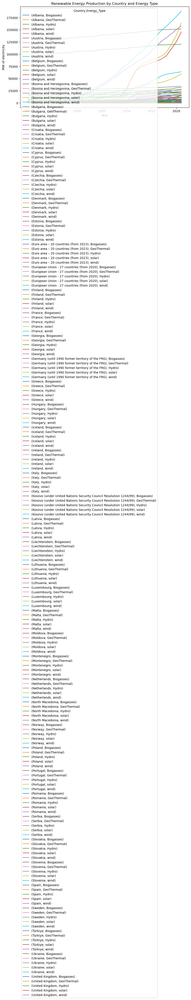

In [65]:
#plotting some time series line graphs to see the various trends in the data. This is quite noisey.
import matplotlib.pyplot as plt

# Set the 'Year' column as the index of the DataFrame
melted_df.set_index('Year', inplace=True)

# Create a pivot table to aggregate the 'MW of electricity' values by 'Country' and 'Energy_Type'
pivot_df = melted_df.pivot_table(values='MW of electricity', index=melted_df.index, columns=['Country', 'Energy_Type'], aggfunc='sum')

# Plot the time series for each 'Country' and 'Energy_Type'
pivot_df.plot(figsize=(10,6), title='Renewable Energy Production by Country and Energy Type')
plt.ylabel('MW of electricity')
plt.show()

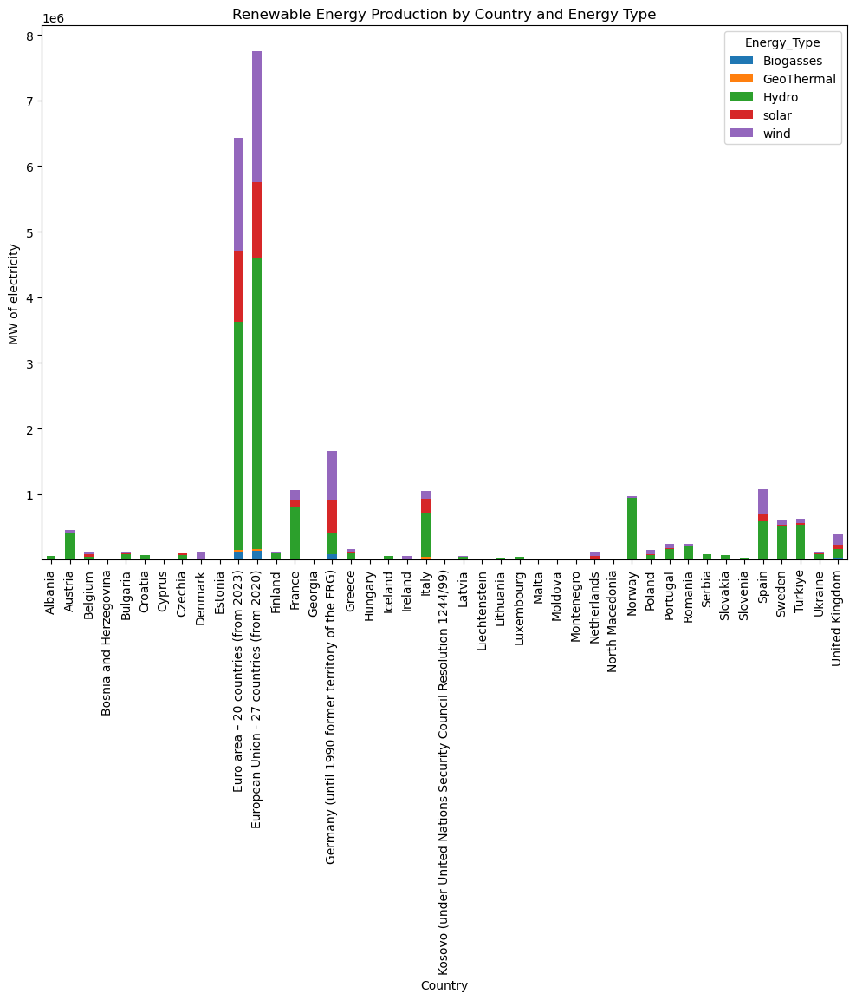

In [47]:
#using a stacked barchat to interpret the data in a more useable way:
import seaborn as sns

# Group the data by country and energy type and sum the MW of electricity
grouped_df = melted_df.groupby(['Country', 'Energy_Type'])['MW of electricity'].sum().reset_index()

# Create a pivot table with the Country as the index, Energy_Type as the columns, and MW of electricity as the values
pivot_df = grouped_df.pivot(index='Country', columns='Energy_Type', values='MW of electricity')

# Plot a stacked bar chart with the pivot table
pivot_df.plot(kind='bar', stacked=True, figsize=(12,8))

# Set the title and axis labels
plt.title('Renewable Energy Production by Country and Energy Type')
plt.xlabel('Country')
plt.ylabel('MW of electricity')

# Show the plot
plt.show()


In [73]:
#This interactive graph allows the selection and investigation of the various countries and their energy production from renewables
import plotly.express as px

# Set the 'Year' column as the index of the DataFrame
#melted_df.set_index('Year', inplace=True)

# Create a pivot table to aggregate the 'MW of electricity' values by 'Country' and 'Energy_Type'
pivot_df = melted_df.pivot_table(values='MW of electricity', index=melted_df.index, columns=['Country', 'Energy_Type'], aggfunc='sum')

# Convert the pivot table to a long format DataFrame with columns for 'Year', 'Country', 'Energy_Type', and 'MW of electricity'
long_df = pivot_df.stack(['Country', 'Energy_Type']).reset_index(name='MW of electricity')

# Create an interactive line chart with Plotly
fig = px.line(long_df, x='Year', y='MW of electricity', color='Country', line_group='Energy_Type', title='Renewable Energy Production by Country and Energy Type')
fig.update_layout(xaxis_title='Year', yaxis_title='MW of electricity')
fig.show()


In [100]:
#Now we will ove into forcasting analysis using SARIMAX
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from statsmodels.tsa.statespace.sarimax import SARIMAX

# Convert the 'Year' column to a datetime data type
#melted_df['Year'] = pd.to_datetime(df['Year'], format='%Y')

# Create a pivot table to aggregate the 'MW of electricity' values by 'Country' and 'Energy_Type'
pivot_df = melted_df.pivot_table(values='MW of electricity', index=melted_df['Year'], columns=['Country', 'Energy_Type'], aggfunc='sum')

# Select a single time series to model
ts = pivot_df['Ireland']['wind']

# Train/test split
train = ts[:'2019']
test = ts['2020':]

# Fit the SARIMA model
model = SARIMAX(train, order=(1, 1, 1), seasonal_order=(1, 1, 1, 12), enforce_stationarity=False, enforce_invertibility=False)
results = model.fit()

# Convert the date strings to datetime objects
start_date = pd.to_datetime('2020-01-01')
end_date = pd.to_datetime('2022-12-01')

# Make predictions on the test set
preds = results.predict(start=start_date, end=end_date, dynamic=True)

# Make predictions on the test set
preds = results.predict(start='2020-01-01', end='2022-12-01', dynamic=True)

# Plot the actual and predicted values
plt.plot(train.index, train.values, label='Training Data')
plt.plot(test.index, test.values, label='Test Data')
plt.plot(preds.index, preds.values, label='Predicted Values')
plt.legend()
plt.show()


C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning:

An unsupported index was provided and will be ignored when e.g. forecasting.

C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning:

An unsupported index was provided and will be ignored when e.g. forecasting.

C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning:

Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.



KeyError: 'The `start` argument could not be matched to a location related to the index of the data.'

C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning:

No frequency information was provided, so inferred frequency AS-JAN will be used.

C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning:

No frequency information was provided, so inferred frequency AS-JAN will be used.

C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning:

Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.



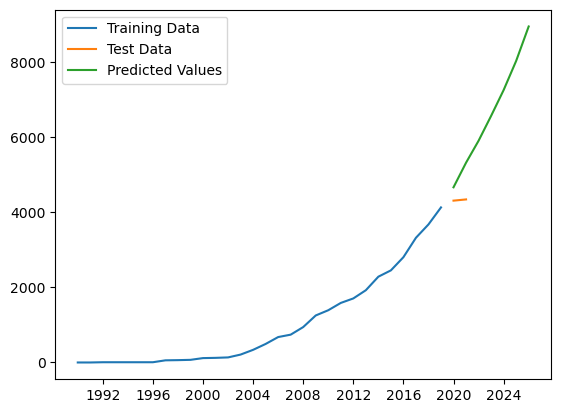

In [108]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from statsmodels.tsa.statespace.sarimax import SARIMAX

# Convert the 'Year' column to a datetime data type
melted_df['Year'] = pd.to_datetime(melted_df['Year'], format='%Y')

# Create a pivot table to aggregate the 'MW of electricity' values by 'Country' and 'Energy_Type'
pivot_df = melted_df.pivot_table(values='MW of electricity', index=melted_df['Year'], columns=['Country', 'Energy_Type'], aggfunc='sum')

# Select a single time series to model
ts = pivot_df['Ireland']['wind']

# Train/test split
train = ts[:'2019']
test = ts['2020':]

# Fit the SARIMA model
model = SARIMAX(train, order=(1, 1, 1), seasonal_order=(1, 1, 1, 12), enforce_stationarity=False, enforce_invertibility=False)
results = model.fit()

# Convert the date strings to datetime objects
start_date = pd.to_datetime('2020-01-01')
end_date = pd.to_datetime('2025-12-01')

# Make predictions on the test set
preds = results.predict(start=start_date, end=end_date, dynamic=True)

# Plot the actual and predicted values
plt.plot(train.index, train.values, label='Training Data')
plt.plot(test.index, test.values, label='Test Data')
plt.plot(preds.index, preds.values, label='Predicted Values')
plt.legend()
plt.show()


C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning:

No frequency information was provided, so inferred frequency AS-JAN will be used.

C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning:

No frequency information was provided, so inferred frequency AS-JAN will be used.

C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning:

Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.

C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning:

No frequency information was provided, so inferred frequency AS-JAN will be used.

C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning:

No frequency information was provided, so inferred frequency AS-JAN will be used.

C:\ProgramData\Anaconda3\lib\site-packages\statsm

Text(0.5, 1.0, 'Current and predicted renewable energy production in Ireland')

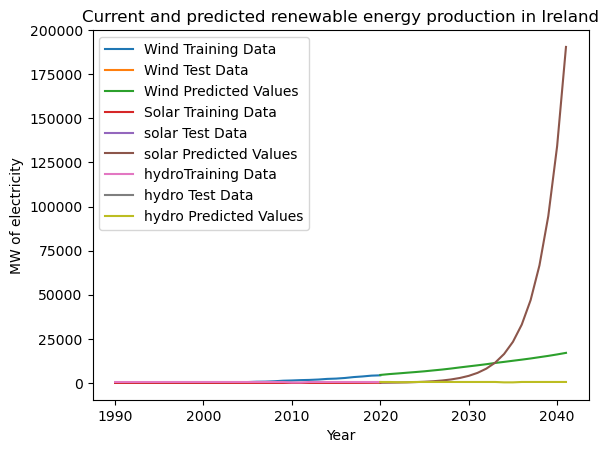

In [124]:
#To understand how important this this reltively new construction sector is forecasting together with other renewables. Similar to forecasting results carried out by IEA 2050 road map.
#Irelands current consumption is 30000000 MWh of electricity Source: https://www.worlddata.info/europe/ireland/energy-consumption.php 
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from statsmodels.tsa.statespace.sarimax import SARIMAX

# Convert the 'Year' column to a datetime data type
melted_df['Year'] = pd.to_datetime(melted_df['Year'], format='%Y')

# Create a pivot table to aggregate the 'MW of electricity' values by 'Country' and 'Energy_Type'
pivot_df = melted_df.pivot_table(values='MW of electricity', index=melted_df['Year'], columns=['Country', 'Energy_Type'], aggfunc='sum')

# Select a single time series to model
ts_wind = pivot_df['Ireland']['wind']
ts_solar = pivot_df['Ireland']['solar']
ts_hydro = pivot_df['Ireland']['Hydro']


# Train/test split
train_wind = ts_wind[:'2020']
test_wind = ts_wind['2021':]

train_solar = ts_solar[:'2020']
test_solar = ts_solar['2021':]

train_hydro = ts_hydro[:'2020']
test_hydro = ts_hydro['2021':]

# Fit the SARIMA model
model_wind = SARIMAX(train_wind, order=(1, 1, 1), seasonal_order=(1, 1, 1, 12), enforce_stationarity=False, enforce_invertibility=False)
results_wind = model_wind.fit()

model_solar = SARIMAX(train_solar, order=(1, 1, 1), seasonal_order=(1, 1, 1, 12), enforce_stationarity=False, enforce_invertibility=False)
results_solar = model_solar.fit()

model_hydro = SARIMAX(train_hydro, order=(1, 1, 1), seasonal_order=(1, 1, 1, 12), enforce_stationarity=False, enforce_invertibility=False)
results_hydro = model_hydro.fit()

# Convert the date strings to datetime objects
start_date = pd.to_datetime('2020-01-01')
end_date = pd.to_datetime('2040-12-01')

# Make predictions on the test set
preds_wind = results_wind.predict(start=start_date, end=end_date, dynamic=True)
preds_solar = results_solar.predict(start=start_date, end=end_date, dynamic=True)
preds_hydro = results_hydro.predict(start=start_date, end=end_date, dynamic=True)


# Plot the actual and predicted values
plt.plot(train_wind.index, train_wind.values, label='Wind Training Data')
plt.plot(test_wind.index, test_wind.values, label='Wind Test Data')
plt.plot(preds_wind.index, preds_wind.values, label='Wind Predicted Values')
plt.legend()
plt.plot(train_solar.index, train_solar.values, label='Solar Training Data')
plt.plot(test_solar.index, test_solar.values, label='solar Test Data')
plt.plot(preds_solar.index, preds_solar.values, label='solar Predicted Values')
plt.legend()
plt.plot(train_hydro.index, train_hydro.values, label='hydroTraining Data')
plt.plot(test_hydro.index, test_hydro.values, label='hydro Test Data')
plt.plot(preds_hydro.index, preds_hydro.values, label='hydro Predicted Values')
plt.legend()

plt.xlabel('Year')
plt.ylabel('MW of electricity')
plt.title('Current and predicted renewable energy production in Ireland')


C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning:

No frequency information was provided, so inferred frequency AS-JAN will be used.

C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning:

No frequency information was provided, so inferred frequency AS-JAN will be used.

C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning:

Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.

C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals

C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning:

No frequency information was provided, so inferred frequency AS-JAN will be used.

C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tsa\base

Text(0.5, 1.0, 'Current and predicted renewable energy production in UK')

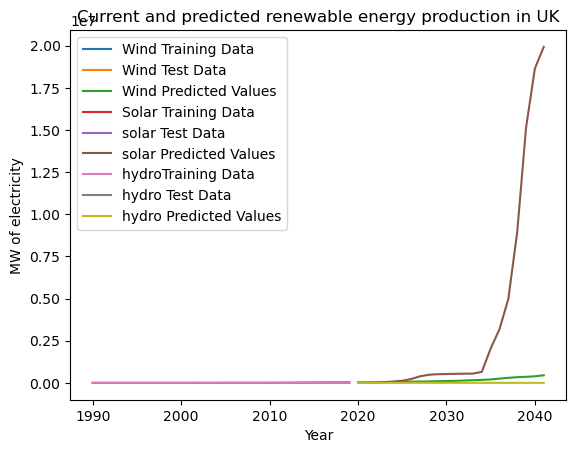

In [125]:
#Compare to UK - IE nearest neighbour 
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from statsmodels.tsa.statespace.sarimax import SARIMAX

# Convert the 'Year' column to a datetime data type
melted_df['Year'] = pd.to_datetime(melted_df['Year'], format='%Y')

# Create a pivot table to aggregate the 'MW of electricity' values by 'Country' and 'Energy_Type'
pivot_df = melted_df.pivot_table(values='MW of electricity', index=melted_df['Year'], columns=['Country', 'Energy_Type'], aggfunc='sum')

# Select a single time series to model
ts_wind = pivot_df['United Kingdom']['wind']
ts_solar = pivot_df['United Kingdom']['solar']
ts_hydro = pivot_df['United Kingdom']['Hydro']


# Train/test split
train_wind = ts_wind[:'2020']
test_wind = ts_wind['2021':]

train_solar = ts_solar[:'2020']
test_solar = ts_solar['2021':]

train_hydro = ts_hydro[:'2020']
test_hydro = ts_hydro['2021':]

# Fit the SARIMA model
model_wind = SARIMAX(train_wind, order=(1, 1, 1), seasonal_order=(1, 1, 1, 12), enforce_stationarity=False, enforce_invertibility=False)
results_wind = model_wind.fit()

model_solar = SARIMAX(train_solar, order=(1, 1, 1), seasonal_order=(1, 1, 1, 12), enforce_stationarity=False, enforce_invertibility=False)
results_solar = model_solar.fit()

model_hydro = SARIMAX(train_hydro, order=(1, 1, 1), seasonal_order=(1, 1, 1, 12), enforce_stationarity=False, enforce_invertibility=False)
results_hydro = model_hydro.fit()

# Convert the date strings to datetime objects
start_date = pd.to_datetime('2020-01-01')
end_date = pd.to_datetime('2040-12-01')

# Make predictions on the test set
preds_wind = results_wind.predict(start=start_date, end=end_date, dynamic=True)
preds_solar = results_solar.predict(start=start_date, end=end_date, dynamic=True)
preds_hydro = results_hydro.predict(start=start_date, end=end_date, dynamic=True)


# Plot the actual and predicted values
plt.plot(train_wind.index, train_wind.values, label='Wind Training Data')
plt.plot(test_wind.index, test_wind.values, label='Wind Test Data')
plt.plot(preds_wind.index, preds_wind.values, label='Wind Predicted Values')
plt.legend()
plt.plot(train_solar.index, train_solar.values, label='Solar Training Data')
plt.plot(test_solar.index, test_solar.values, label='solar Test Data')
plt.plot(preds_solar.index, preds_solar.values, label='solar Predicted Values')
plt.legend()
plt.plot(train_hydro.index, train_hydro.values, label='hydroTraining Data')
plt.plot(test_hydro.index, test_hydro.values, label='hydro Test Data')
plt.plot(preds_hydro.index, preds_hydro.values, label='hydro Predicted Values')
plt.legend()


plt.xlabel('Year')
plt.ylabel('MW of electricity')
plt.title('Current and predicted renewable energy production in UK')



C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning:

No frequency information was provided, so inferred frequency AS-JAN will be used.

C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning:

No frequency information was provided, so inferred frequency AS-JAN will be used.

C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning:

Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.

C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning:

No frequency information was provided, so inferred frequency AS-JAN will be used.

C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning:

No frequency information was provided, so inferred frequency AS-JAN will be used.

C:\ProgramData\Anaconda3\lib\site-packages\statsm

Text(0.5, 1.0, 'Current and predicted renewable energy production in France')

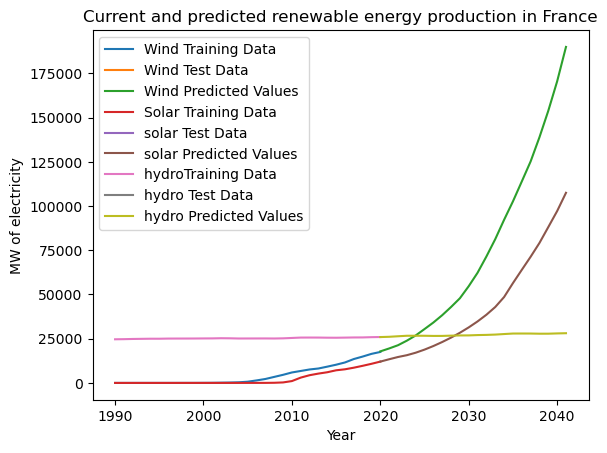

In [126]:
#Compare to France - FR has a heavy reliance on Nuclear power generation and a pipeline of new nuclear projects.
#Although Fr has better sunshine hours than IE, their wind power generation of electricty is forecasted to be more than solar going into 2040.
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from statsmodels.tsa.statespace.sarimax import SARIMAX

# Convert the 'Year' column to a datetime data type
melted_df['Year'] = pd.to_datetime(melted_df['Year'], format='%Y')

# Create a pivot table to aggregate the 'MW of electricity' values by 'Country' and 'Energy_Type'
pivot_df = melted_df.pivot_table(values='MW of electricity', index=melted_df['Year'], columns=['Country', 'Energy_Type'], aggfunc='sum')

# Select a single time series to model
ts_wind = pivot_df['France']['wind']
ts_solar = pivot_df['France']['solar']
ts_hydro = pivot_df['France']['Hydro']


# Train/test split
train_wind = ts_wind[:'2020']
test_wind = ts_wind['2021':]

train_solar = ts_solar[:'2020']
test_solar = ts_solar['2021':]

train_hydro = ts_hydro[:'2020']
test_hydro = ts_hydro['2021':]

# Fit the SARIMA model
model_wind = SARIMAX(train_wind, order=(1, 1, 1), seasonal_order=(1, 1, 1, 12), enforce_stationarity=False, enforce_invertibility=False)
results_wind = model_wind.fit()

model_solar = SARIMAX(train_solar, order=(1, 1, 1), seasonal_order=(1, 1, 1, 12), enforce_stationarity=False, enforce_invertibility=False)
results_solar = model_solar.fit()

model_hydro = SARIMAX(train_hydro, order=(1, 1, 1), seasonal_order=(1, 1, 1, 12), enforce_stationarity=False, enforce_invertibility=False)
results_hydro = model_hydro.fit()

# Convert the date strings to datetime objects
start_date = pd.to_datetime('2020-01-01')
end_date = pd.to_datetime('2040-12-01')

# Make predictions on the test set
preds_wind = results_wind.predict(start=start_date, end=end_date, dynamic=True)
preds_solar = results_solar.predict(start=start_date, end=end_date, dynamic=True)
preds_hydro = results_hydro.predict(start=start_date, end=end_date, dynamic=True)


# Plot the actual and predicted values
plt.plot(train_wind.index, train_wind.values, label='Wind Training Data')
plt.plot(test_wind.index, test_wind.values, label='Wind Test Data')
plt.plot(preds_wind.index, preds_wind.values, label='Wind Predicted Values')
plt.legend()
plt.plot(train_solar.index, train_solar.values, label='Solar Training Data')
plt.plot(test_solar.index, test_solar.values, label='solar Test Data')
plt.plot(preds_solar.index, preds_solar.values, label='solar Predicted Values')
plt.legend()
plt.plot(train_hydro.index, train_hydro.values, label='hydroTraining Data')
plt.plot(test_hydro.index, test_hydro.values, label='hydro Test Data')
plt.plot(preds_hydro.index, preds_hydro.values, label='hydro Predicted Values')
plt.legend()

plt.xlabel('Year')
plt.ylabel('MW of electricity')
plt.title('Current and predicted renewable energy production in France')

In [132]:
#Moving onto the use of ML model for the purpose of forcasting similar to above. Regression is ideal here so SV ML will be used.
# group the data by year and energy type and calculate the sum of MW of electricity generated by each type of energy in each year
#On attempting ML (SVM) for this time series data i realise that SVM is not ideal as the model expects the varabiles to be independant of each other and the temporal nature of this time series data breaches that. 
#I will move to carrying out ML modelling on predicitions of electrivty production from the new constructtion matrials in the sloar space. 
#End.



TypeError: float() argument must be a string or a number, not 'Timestamp'

In [139]:
!pip install -U kaleido

Defaulting to user installation because normal site-packages is not writeable


In [148]:
import os
import plotly.io as pio

# Define the path to the folder where the figures will be saved
folder_path = 'D:/CA2_figs'

# Save all figures in notebook to folder as PNG files
figures = [fig for fig in plt.get_fignums()]
for i, fig in enumerate(figures):
    # Extract the figure name from the title of the figure
    fig_title = fig['layout']['title']['text']
    print(f'fig_title: {fig_title}')
    fig_name = fig_title.split(':')[0]
    print(f'fig_name: {fig_name}')
    
    file_path = os.path.join(folder_path, f'{fig_name}_{i+1}.png')
    pio.write_image(fig, file_path)




In [153]:
import os
import plotly.io as pio

# Define the path to the folder where the figures will be saved
folder_path = 'D:/CA2_figs'

# Get all figures in the notebook
figures = []
for i, template_name in enumerate(sorted(list(pio.templates.keys()))):
    try:
        fig = pio.to_json(pio.templates[template_name])
        figures.append(fig)
    except Exception as e:
        print(f'Error encountered with template {template_name}: {e}')

# Print the number of figures found
print(f'{len(figures)} figures found')

# Save all figures in notebook to folder as PNG files
for i, fig in enumerate(figures):
    # Extract the figure name from the title of the figure
    fig_title = fig['layout']['title']['text']
    fig_name = fig_title.split(':')[0]
    
    file_path = os.path.join(folder_path, f'{fig_name}_{i+1}.png')
    pio.write_image(fig, file_path)




Error encountered with template ggplot2: 'str' object has no attribute 'pop'
Error encountered with template gridon: 'str' object has no attribute 'pop'
Error encountered with template none: 'str' object has no attribute 'pop'
Error encountered with template plotly: 'str' object has no attribute 'pop'
Error encountered with template plotly_dark: 'str' object has no attribute 'pop'
Error encountered with template plotly_white: 'str' object has no attribute 'pop'
Error encountered with template presentation: 'str' object has no attribute 'pop'
Error encountered with template seaborn: 'str' object has no attribute 'pop'
Error encountered with template simple_white: 'str' object has no attribute 'pop'
Error encountered with template xgridoff: 'str' object has no attribute 'pop'
Error encountered with template ygridoff: 'str' object has no attribute 'pop'
0 figures found


In [172]:
#Create folder on D drive to house plots.
import os
os.makedirs('D:/plots', exist_ok=True)


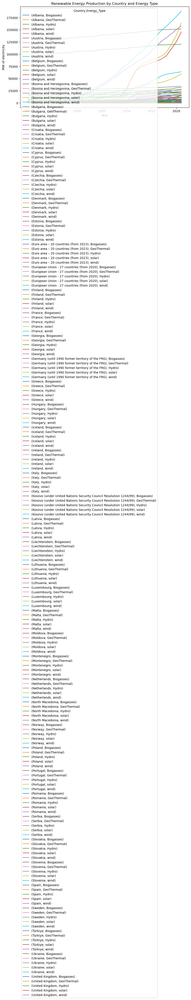


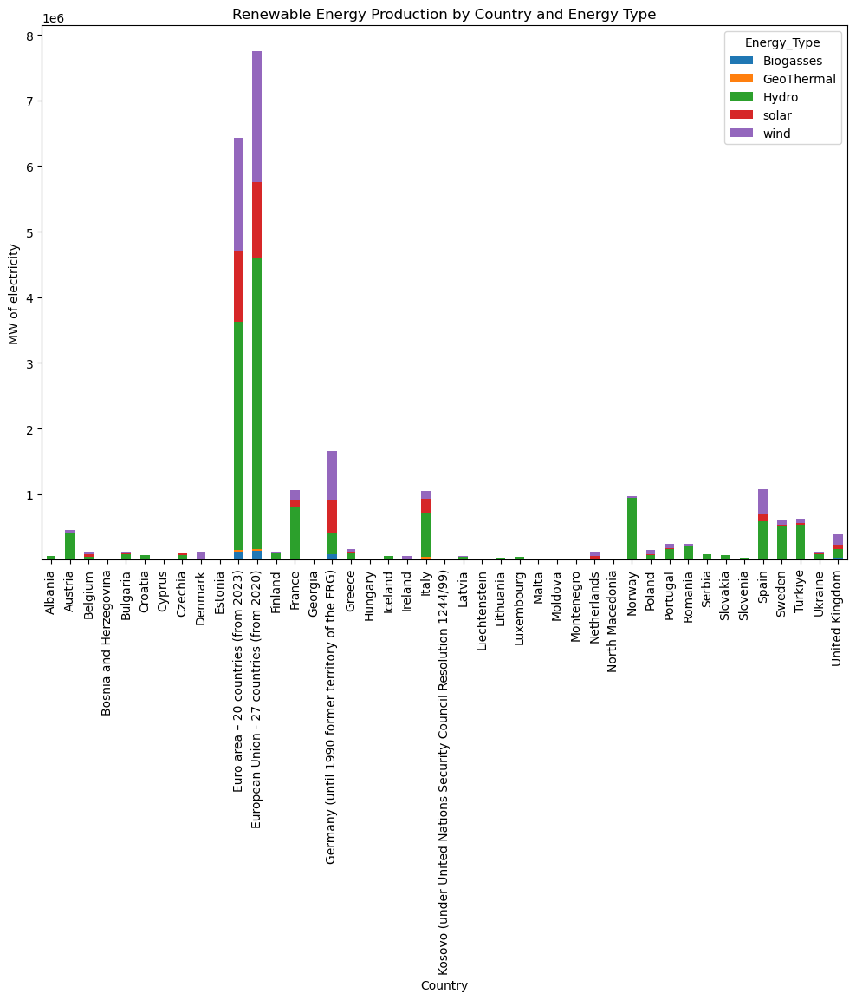


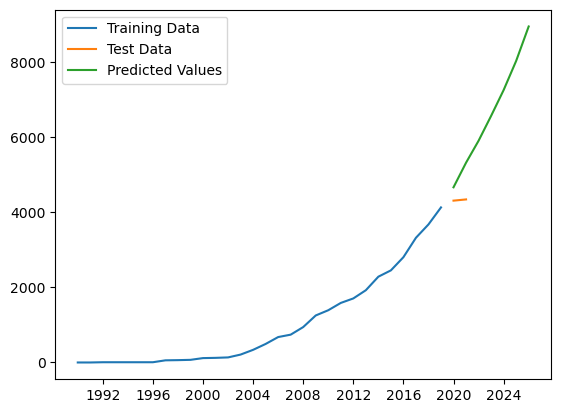


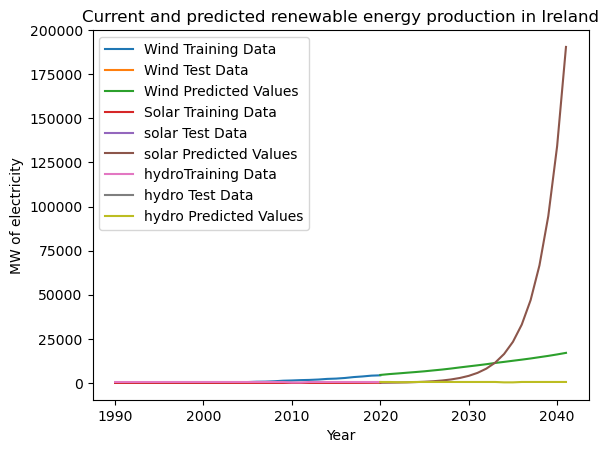


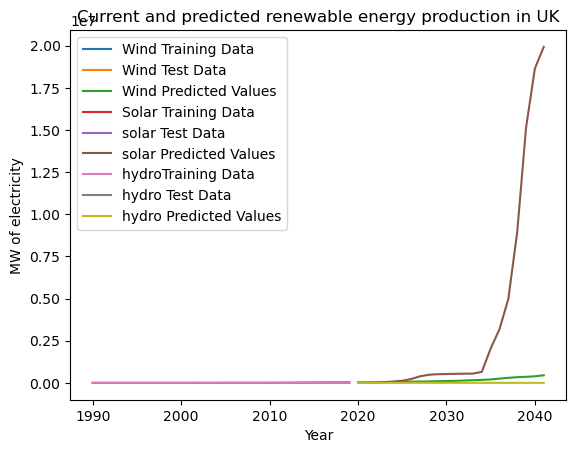


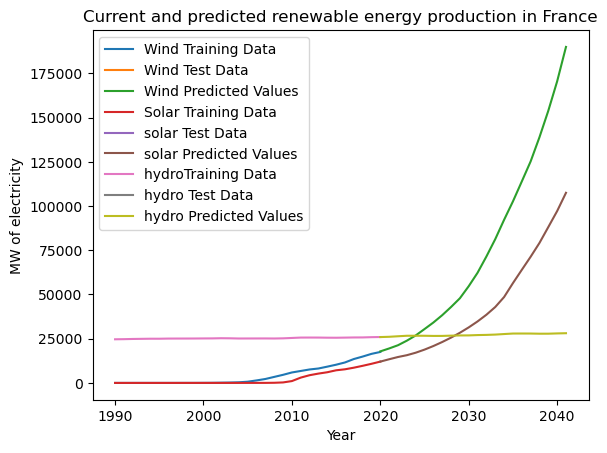

In [174]:
#Extract the plots so far onto the D drive for implemention on the report.
import nbformat
from IPython.display import display, HTML
import base64

# Load the notebook file
nb = nbformat.read('CA2_Noteboook.ipynb', as_version=4)

# Find all output cells and extract image data
for i, cell in enumerate(nb.cells):
    if cell.get('outputs'):
        for j, output in enumerate(cell.outputs):
            if output.output_type == 'display_data':
                # Extract PNG data from image data
                if 'image/png' in output.data:
                    png_data = output.data['image/png']
                    # Save the PNG data to a file
                    with open(f'D:/plots/plot_{i}_{j}.png', 'wb') as f:
                        f.write(base64.b64decode(png_data))
                    # Display the PNG image in the notebook
                    display(HTML(f'<img src="data:image/png;base64,{png_data}" />'))




In [96]:
melted_df.columns

Index(['Country', 'Energy_Type', 'Year', 'MW of electricity'], dtype='object')

In [97]:
melted_df.info

<bound method DataFrame.info of                                                 Country Energy_Type    Year  \
1             European Union - 27 countries (from 2020)       solar  1990.0   
2                  Euro area – 20 countries (from 2023)       solar  1990.0   
3                                               Belgium       solar  1990.0   
4                                              Bulgaria       solar  1990.0   
5                                               Czechia       solar  1990.0   
...                                                 ...         ...     ...   
7511                                            Albania   Biogasses  2021.0   
7512                                             Serbia   Biogasses  2021.0   
7513                                            Türkiye   Biogasses  2021.0   
7515  Kosovo (under United Nations Security Council ...   Biogasses  2021.0   
7516                                            Georgia   Biogasses  2021.0   

      MW of electri

Here is the licence conditions to use the API for the photovoltaic access of the JRC.

Copyright (c) 2019, Stian Hanger

Permission is hereby granted, free of charge, to any person obtaining a copy of this software and associated documentation files (the "Software"), to deal in the Software without restriction, including without limitation the rights to use, copy, modify, merge, publish, distribute, sublicense, and/or sell copies of the Software, and to permit persons to whom the Software is furnished to do so, subject to the following conditions:

The above copyright notice and this permission notice shall be included in all copies or substantial portions of the Software.

THE SOFTWARE IS PROVIDED "AS IS", WITHOUT WARRANTY OF ANY KIND, EXPRESS OR IMPLIED, INCLUDING BUT NOT LIMITED TO THE WARRANTIES OF MERCHANTABILITY, FITNESS FOR A PARTICULAR PURPOSE AND NONINFRINGEMENT. IN NO EVENT SHALL THE AUTHORS OR COPYRIGHT HOLDERS BE LIABLE FOR ANY CLAIM, DAMAGES OR OTHER LIABILITY, WHETHER IN AN ACTION OF CONTRACT, TORT OR OTHERWISE, ARISING FROM, OUT OF OR IN CONNECTION WITH THE SOFTWARE OR THE USE OR OTHER DEALINGS IN THE SOFTWARE.

MIT License
A short and simple permissive license with conditions only requiring preservation of copyright and license notices. Licensed works, modifications, and larger works may be distributed under different terms and without source code.

Permissions
 Commercial use
 Modification
 Distribution
 Private use
Limitations
 Liability
 Warranty
Conditions
 License and copyright notice

In [ ]:
#Build a calculator for Farmers availing of state grants for Solar to outline to them the savings over time and their ROI.
import requests

# PVWatts API endpoint and access key
url = "https://developer.nrel.gov/api/pvwatts/v6.json"
api_key = "68lPY1SlxChRLkHWTAMi4uIL7RSUbhRylNLsRPD9"

# Parameters for the solar PV system
system_capacity = 10  # kW
module_type = 0  # Standard
losses = 10  # Percentage
array_type = 1  # Fixed
tilt = 35  # Degrees
azimuth = 180  # Degrees
lat = 53.350140  # Latitude of Dublin
lon = -6.266155  # Longitude of Dublin
timeframe = "hourly"

# Electricity rate in euro per kWh
electricity_rate = 0.2

# Set up the API request
params = {
    "api_key": api_key,
    "system_capacity": system_capacity,
    "module_type": module_type,
    "losses": losses,
    "array_type": array_type,
    "tilt": tilt,
    "azimuth": azimuth,
    "lat": lat,
    "lon": lon,
    "dataset": "intl",  # add this parameter to check for international data
    "timeframe": "hourly",
}

# Make the API request
response = requests.get(url, params=params)

# Parse the response
data = response.json()
#print(data)

# Extract the relevant information
annual_energy = data["outputs"]["ac_annual"]
savings = annual_energy * electricity_rate

# Print the results
print("Estimated annual energy production: {:.2f} kWh".format(annual_energy))
print("Estimated savings per year: {:.2f} euro".format(savings))


In [ ]:
import requests

# PVWatts API endpoint and access key
url = "https://developer.nrel.gov/api/pvwatts/v6.json"
api_key = "68lPY1SlxChRLkHWTAMi4uIL7RSUbhRylNLsRPD9"

# Parameters for the solar PV system
system_capacity = float(input("Enter the system capacity in kW: "))
module_type = int(input("Select the module type: 0 - Standard, 1 - Premium, 2 - Thin film: "))
losses = float(input("Enter the losses as a percentage: "))
array_type = int(input("Select the array type: 0 - Fixed, 1 - 1-axis, 2 - 2-axis: "))
tilt = float(input("Enter the tilt angle in degrees: "))
azimuth = float(input("Enter the azimuth angle in degrees: "))
lat = float(input("Enter the latitude: "))
lon = float(input("Enter the longitude: "))
timeframe = input("Select the timeframe: hourly, daily, monthly: ")
electricity_rate = float(input("Enter the electricity rate in euro per kWh: "))

# Set up the API request
params = {
    "api_key": api_key,
    "system_capacity": system_capacity,
    "module_type": module_type,
    "losses": losses,
    "array_type": array_type,
    "tilt": tilt,
    "azimuth": azimuth,
    "lat": lat,
    "lon": lon,
    "dataset": "intl",
    "timeframe": timeframe,
}

# Make the API request
response = requests.get(url, params=params)

# Parse the response
data = response.json()

# Extract the relevant information
annual_energy = data["outputs"]["ac_annual"]
savings = annual_energy * electricity_rate

# Print the results
print("Estimated annual energy production: {:.2f} kWh".format(annual_energy))
print("Estimated savings per year: {:.2f} euro".format(savings))


In [ ]:
import requests

# PVWatts API endpoint and access key
url = "https://developer.nrel.gov/api/pvwatts/v6.json"
api_key = "68lPY1SlxChRLkHWTAMi4uIL7RSUbhRylNLsRPD9"

# Get the address from the farmer
address = input("Enter the address: ")

# Convert the address to latitude and longitude using OSM
geocode_url = "https://nominatim.openstreetmap.org/search/" + address + "?format=json"
geocode_response = requests.get(geocode_url)
geocode_data = geocode_response.json()
lat = float(geocode_data[0]["lat"])
lon = float(geocode_data[0]["lon"])

# Parameters for the solar PV system
system_capacity = float(input("Enter the system capacity in kW: "))
module_type = int(input("Select the module type: 0 - Standard, 1 - Premium, 2 - Thin film: "))
losses = float(input("Enter the losses as a percentage: "))
array_type = int(input("Select the array type: 0 - Fixed, 1 - 1-axis, 2 - 2-axis: "))
tilt = float(input("Enter the tilt angle in degrees: "))
azimuth = float(input("Enter the azimuth angle in degrees: "))
timeframe = input("Select the timeframe: hourly, daily, monthly: ")
electricity_rate = float(input("Enter the electricity rate in euro per kWh: "))

# Set up the API request
params = {
    "api_key": api_key,
    "system_capacity": system_capacity,
    "module_type": module_type,
    "losses": losses,
    "array_type": array_type,
    "tilt": tilt,
    "azimuth": azimuth,
    "lat": lat,
    "lon": lon,
    "dataset": "intl",
    "timeframe": timeframe,
}

# Make the API request
response = requests.get(url, params=params)

# Parse the response
data = response.json()

# Extract the relevant information
annual_energy = data["outputs"]["ac_annual"]
savings = annual_energy * electricity_rate

# Print the results
print("Estimated annual energy production: {:.2f} kWh".format(annual_energy))
print("Estimated savings per year: {:.2f} euro".format(savings))


In [ ]:
#use
import requests
import matplotlib.pyplot as plt

# PVWatts API endpoint and access key
url = "https://developer.nrel.gov/api/pvwatts/v6.json"
api_key = "68lPY1SlxChRLkHWTAMi4uIL7RSUbhRylNLsRPD9"

# Get the address from the user
address = input("Enter the address: ")

# Convert the address to latitude and longitude using OpenStreetMap Nominatim API
geocode_url = "https://nominatim.openstreetmap.org/search"
params = {"q": address, "format": "jsonv2"}
response = requests.get(geocode_url, params=params)
data = response.json()
if len(data) == 0:
    print("No results found for the address")
    exit()
lat = data[0]["lat"]
lon = data[0]["lon"]

# Get the parameters from the user
system_capacity = float(input("Enter the system capacity in kW: "))
module_type = int(input("Select the module type: 0 - Standard, 1 - Premium, 2 - Thin film: "))
losses = float(input("Enter the losses as a percentage: "))
array_type = int(input("Select the array type: 0 - Fixed, 1 - 1-axis, 2 - 2-axis: "))
tilt = float(input("Enter the tilt angle in degrees: "))
azimuth = float(input("Enter the azimuth angle in degrees: "))
timeframe = input("Select the timeframe: hourly, daily, monthly: ")
electricity_rate = float(input("Enter the electricity rate in euro per kWh: "))

# Get the initial cost of the system from the user
system_cost = float(input("Enter the initial cost of the system in euro: "))

# Set up the API request
params = {
    "api_key": api_key,
    "system_capacity": system_capacity,
    "module_type": module_type,
    "losses": losses,
    "array_type": array_type,
    "tilt": tilt,
    "azimuth": azimuth,
    "lat": lat,
    "lon": lon,
    "dataset": "intl",
    "timeframe": timeframe,
}

# Make the API request
response = requests.get(url, params=params)

# Parse the response
data = response.json()

# Extract the relevant information
annual_energy = data["outputs"]["ac_annual"]
savings = annual_energy * electricity_rate
payback_period = round(system_cost / savings, 1)

# Print the results
print("Estimated annual energy production: {:.2f} kWh".format(annual_energy))
print("Estimated savings per year: {:.2f} euro".format(savings))
print("Payback period: {} years".format(payback_period))

# Plot the payback period
x = range(1, int(payback_period) + 2)
y = [system_cost - savings * i for i in x]
plt.plot(x, y)
plt.xlabel("Years")
plt.ylabel("Cumulative Savings (euro)")
plt.title("Payback Period for Solar PV System")
plt.show()


In [ ]:
#use
import requests
import json
from geopy.geocoders import Nominatim
import matplotlib.pyplot as plt
import numpy as np

# PVWatts API endpoint and access key
url = "https://developer.nrel.gov/api/pvwatts/v6.json"
api_key = "68lPY1SlxChRLkHWTAMi4uIL7RSUbhRylNLsRPD9"

# Get user input for the address and system parameters
address = input("Enter the address: ")
system_capacity = float(input("Enter the system capacity in kW: "))
module_type = int(input("Select the module type: 0 - Standard, 1 - Premium, 2 - Thin film: "))
losses = float(input("Enter the losses as a percentage: "))
array_type = int(input("Select the array type: 0 - Fixed, 1 - 1-axis, 2 - 2-axis: "))
tilt = float(input("Enter the tilt angle in degrees: "))
azimuth = float(input("Enter the azimuth angle in degrees: "))
timeframe = input("Select the timeframe: hourly, daily, monthly: ")
electricity_rate = float(input("Enter the electricity rate in euro per kWh: "))
system_cost = float(input("Enter the cost of the system in euro: "))

# Calculate the total energy consumption of the farmer
energy_consumption = float(input("Enter the total energy consumption of the farmer in kWh: "))

# Convert the address to latitude and longitude using OpenStreetMap
geolocator = Nominatim(user_agent="pvwatts")
location = geolocator.geocode(address)
lat, lon = location.latitude, location.longitude

# Set up the API request
params = {
    "api_key": api_key,
    "system_capacity": system_capacity,
    "module_type": module_type,
    "losses": losses,
    "array_type": array_type,
    "tilt": tilt,
    "azimuth": azimuth,
    "lat": lat,
    "lon": lon,
    "dataset": "intl",
    "timeframe": timeframe,
}

# Make the API request
response = requests.get(url, params=params)

# Parse the response
data = response.json()

# Extract the relevant information
annual_energy = data["outputs"]["ac_annual"]
savings = annual_energy * electricity_rate
payback_period = system_cost / savings

# Calculate the energy offset
energy_offset = (annual_energy / energy_consumption) * 100

# Print the results
print("Estimated annual energy production: {:.2f} kWh".format(annual_energy))
print("Estimated savings per year: {:.2f} euro".format(savings))
print("Cost of the system: {:.2f} euro".format(system_cost))
print("Payback period: {:.2f} years".format(payback_period))
print("Percentage of energy offset: {:.2f}%".format(energy_offset))

# Create a graph showing the payback period and break-even point
x = np.arange(1, int(payback_period) + 2)
y = np.full_like(x, -system_cost / payback_period) + savings * x

plt.plot(x, y)
plt.xlabel("Years")
plt.ylabel("Savings (euro)")
plt.title("Payback Period")

# Add a vertical line for the break-even point
plt.axvline(x=payback_period, color="r", linestyle="--")

plt.show()


In [ ]:
#use
import requests
import json
from geopy.geocoders import Nominatim
import matplotlib.pyplot as plt
import numpy as np

# PVWatts API endpoint and access key
url = "https://developer.nrel.gov/api/pvwatts/v6.json"
api_key = "68lPY1SlxChRLkHWTAMi4uIL7RSUbhRylNLsRPD9"

# Get user input for the address and system parameters
address = input("Enter the address: ")
system_capacity = float(input("Enter the system capacity in kW: "))
module_type = int(input("Select the module type: 0 - Standard, 1 - Premium, 2 - Thin film: "))
losses = float(input("Enter the losses as a percentage: "))
array_type = int(input("Select the array type: 0 - Fixed, 1 - 1-axis, 2 - 2-axis: "))
tilt = float(input("Enter the tilt angle in degrees: "))
azimuth = float(input("Enter the azimuth angle in degrees: "))
timeframe = input("Select the timeframe: hourly, daily, monthly: ")
electricity_rate = float(input("Enter the electricity rate in euro per kWh: "))

# Calculate the total energy consumption of the farmer
energy_consumption = float(input("Enter the total energy consumption of the farmer in kWh: "))

# Get the cost of the system
system_cost = float(input("Enter the cost of the system in euro: "))

# Convert the address to latitude and longitude using OpenStreetMap
geolocator = Nominatim(user_agent="pvwatts")
location = geolocator.geocode(address)

if location is None:
    print("Error: Invalid address, please try again.")
    exit()

lat, lon = location.latitude, location.longitude

# Set up the API request
params = {
    "api_key": api_key,
    "system_capacity": system_capacity,
    "module_type": module_type,
    "losses": losses,
    "array_type": array_type,
    "tilt": tilt,
    "azimuth": azimuth,
    "lat": lat,
    "lon": lon,
    "dataset": "intl",
    "timeframe": timeframe,
}

# Make the API request
response = requests.get(url, params=params)

# Parse the response
data = response.json()

# Extract the relevant information
annual_energy = data["outputs"]["ac_annual"]
savings = annual_energy * electricity_rate
payback_period = system_cost / savings

# Calculate the energy offset
energy_offset = (annual_energy / energy_consumption) * 100

# Print the results
print("Estimated annual energy production: {:.2f} kWh".format(annual_energy))
print("Estimated savings per year: {:.2f} euro".format(savings))
print("Cost of the system: {:.2f} euro".format(system_cost))
print("Payback period: {:.2f} years".format(payback_period))
print("Percentage of energy offset: {:.2f}%".format(energy_offset))

# Plot the payback period
x = range(1, int(payback_period) + 2)
y = [system_cost - savings * i for i in x]
plt.plot(x, y)
plt.xlabel("Years")
plt.ylabel("Cumulative Savings (euro)")
plt.title("Payback Period for Solar PV System")
plt.show()


plt.show()

# Create a graph showing the energy offset


In [ ]:
import requests
import json
from geopy.geocoders import Nominatim
import matplotlib.pyplot as plt
from flask import Flask, render_template, request

# PVWatts API endpoint and access key
url = "https://developer.nrel.gov/api/pvwatts/v6.json"
api_key = "68lPY1SlxChRLkHWTAMi4uIL7RSUbhRylNLsRPD9"

app = Flask(__name__)

@app.route('/')
def index():
    return render_template('index.html')

@app.route('/results', methods=['POST'])
def results():
    # Get user input for the address and system parameters
    address = request.form['address']
    system_capacity = float(request.form['system_capacity'])
    module_type = int(request.form['module_type'])
    losses = float(request.form['losses'])
    array_type = int(request.form['array_type'])
    tilt = float(request.form['tilt'])
    azimuth = float(request.form['azimuth'])
    timeframe = request.form['timeframe']
    electricity_rate = float(request.form['electricity_rate'])
    energy_consumption = float(request.form['energy_consumption'])
    system_cost = float(request.form['system_cost'])

    # Convert the address to latitude and longitude using OpenStreetMap
    geolocator = Nominatim(user_agent="pvwatts")
    location = geolocator.geocode(address)

    if location is None:
        return render_template('error.html')

    lat, lon = location.latitude, location.longitude

    # Set up the API request
    params = {
        "api_key": api_key,
        "system_capacity": system_capacity,
        "module_type": module_type,
        "losses": losses,
        "array_type": array_type,
        "tilt": tilt,
        "azimuth": azimuth,
        "lat": lat,
        "lon": lon,
        "dataset": "intl",
        "timeframe": timeframe,
    }

    # Make the API request
    response = requests.get(url, params=params)

    # Parse the response
    data = response.json()

    # Extract the relevant information
    annual_energy = data["outputs"]["ac_annual"]
    savings = annual_energy * electricity_rate
    payback_period = system_cost / savings
    energy_offset = (annual_energy / energy_consumption) * 100

    # Render the results template
    return render_template('results.html', annual_energy=annual_energy, savings=savings, system_cost=system_cost,
        payback_period=payback_period, energy_offset=energy_offset)

if __name__ == '__main__':
    app.run()


In [ ]:
#Start of sentiment analysis from solar panels providers as reviewed by customers from www.solarreviews.com


